# **Music generation with CNN-based GAN and VAE**

by Erica Brisigotti (2097202) & Ekaterina Chueva (2072050)

In [ ]:
# firstly, we import all the packages needed for the analysis
import glob
import numpy as np
import pandas as pd
import random
import pretty_midi
#import mir_eval.display
# from collections import defaultdict
import matplotlib.pyplot as plt
# import librosa.display
import joblib
import itertools
import copy
import os
import random
from scipy.linalg import sqrtm
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
import torch.nn as nn
import torch.optim as optim

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')
# given_data_dir = '/content/drive/MyDrive/Colab Notebooks/MIDI/maestro-v3.0.0'
given_data_dir = 'C:/Users/ecica/Desktop/NNaDL_project/maestro-v3.0.0'

In [ ]:
# we initialize the path that willl be common to the sets
# dataset_dir = '/content/drive/MyDrive/Colab Notebooks/melody_matrices'
dataset_dir = 'C:/Users/ecica/Desktop/NNaDL_project/melody_matrices'
# and a saving option
make_dataset_dir = False

# **1. Dataset analysis and preprocessing**

## **1.1 Dataset presentation and analysis**

Firstly, we import and characterize the dataset, which is a series of MIDI files.

A **MIDI** file is a type of digital music file that stores information about musical notes and events, rather than actual audio: MIDI files
- are split into channels, one for each instrument: each channel contains an ordered set of musical notes (called *piano roll*) played by the instrument, each one with its own duration and intensity (called *velocity*): each piano roll can be represented as a $M$ by $N$ matrix (with $M$ notes, ordered in increasing pitch, and $N$ timesteps)
- includes (as metadata) information about the musical piece, like tempo (in BPM) and key and time signatures

The advantages of the MIDI format include:
- their symbolic nature is suitable for ML applications (e.g. music generation) and allows for easy conversion to numerical features
- a small file sizes (e.g. compared to MP3 files)
- highly structured data with high level musical information (e.g. melody, harmony, rythm, instruments)

Specifically, we will be using the [MAESTRO dataset](https://magenta.tensorflow.org/datasets/maestro#v300) which has the following metadata:
- `canonical_composer`: the composer of the piece
- `canonical_title`: the title of the piece
- `split`: the suggested train/validation/test split
- `year`: the year of performance
- `midi_filename`: the MIDI filename
- `audio_filename`: the WAV filename
- `duration`: the duration in seconds.


In [ ]:
# and count the number of midi files to examine
filenames = glob.glob(given_data_dir+'/**/*.mid*')
n_files = len(filenames)
print('the total number of MIDI files is', len(filenames))

the total number of MIDI files is 1276


In [ ]:
def compute_statistics(midi_file):
    '''
    function that, given a string path to a MIDI file, compute a dictionary of statistics about it
    '''
    # we try to run the statistical analysis
    err_counter=0
    try:
        pm = pretty_midi.PrettyMIDI(midi_file)
        # Extract informative events from the MIDI file
        return {'n_instruments': len(pm.instruments),
                'program_numbers': [i.program for i in pm.instruments if not i.is_drum],
                'key_numbers': [k.key_number for k in pm.key_signature_changes],
                'tempos': list(pm.get_tempo_changes()[1]),
                'time_signature_changes': pm.time_signature_changes,
                'end_time': pm.get_end_time(),
                'lyrics': [l.text for l in pm.lyrics],
                'resolution': pm.resolution }
    # when we can't, we silently ignore exceptions (on loading, if they are invalid) for a
    # clean presentation, and skip them
    except Exception as e:
        err_counter+=1
        pass
    print(err_counter)

In [ ]:
# we use the previously defined function to compute the statistics about every file in our
# collection in parallel using joblib (since the dataset is very large and would otherwise
# take a very long time)
statistics = joblib.Parallel(n_jobs=10, verbose=0)(
    joblib.delayed(compute_statistics)(midi_file)
    for midi_file in filenames)
# to merge the results, excluding the exceptions that were found in the function
# (and returned None)
statistics = [s for s in statistics if s is not None]

In [ ]:
def plotting(input1, input2, bin1, bin2, title1, title2, meaningful_ticks=True):
    '''
    function that plots the histograms of two quantities (input1, input2) side by side,
    using centered unit bins with minimum and maximum bins specified by
    - bin1 = [start1, end1, step1]
    - bin2 = [start2, end2, step2]
    '''
    start1, end1, step1 = bin1[0], bin1[1], bin1[2]
    start2, end2, step2 = bin2[0], bin2[1], bin2[2]
    _, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4)) #, facecolor='papayawhip')

    ax[0].set_title(title1)
    ax[0].set_xlabel(title1)
    ax[0].set_ylabel('occurrences')
    ax[0].hist(input1, rwidth=0.9, bins=np.arange((start1+0.5), (end1-0.5), step1))
    ax[0].set_xlim(start1-1, end1+1)

    ax[1].set_title(title2)
    ax[1].set_xlabel(title2)
    ax[1].set_ylabel('occurrences')
    ax[1].hist(input2, rwidth=0.9, bins=np.arange((start2+0.5), (end2-0.5), step2))
    ax[1].set_xlim(start2-1, end2+1)

    if meaningful_ticks:
        ax[0].set_xticks(np.unique(input1))
        ax[1].set_xticks(np.unique(input2))

    plt.show()

We can now analize the statistics of some key characteristics

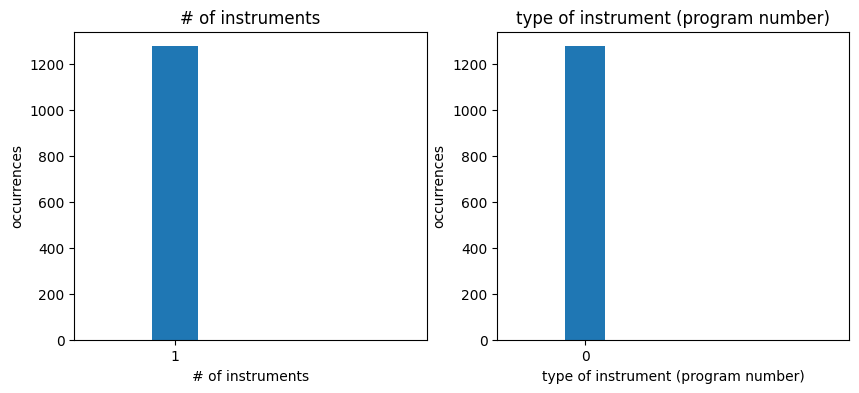

In [ ]:
plotting(input1 = [s['n_instruments'] for s in statistics],
             input2 = [i for s in statistics for i in s['program_numbers']],
             bin1 = [0, 5, 1], bin2 = [-1, 5, 1],
             title1 = '# of instruments', title2 = 'type of instrument (program number)')

We can see that, in each MIDI file, only one instrument is being used, and that instrument is the acoustic grand piano (corresponding to program number 0, in a scale from 0 to 127).

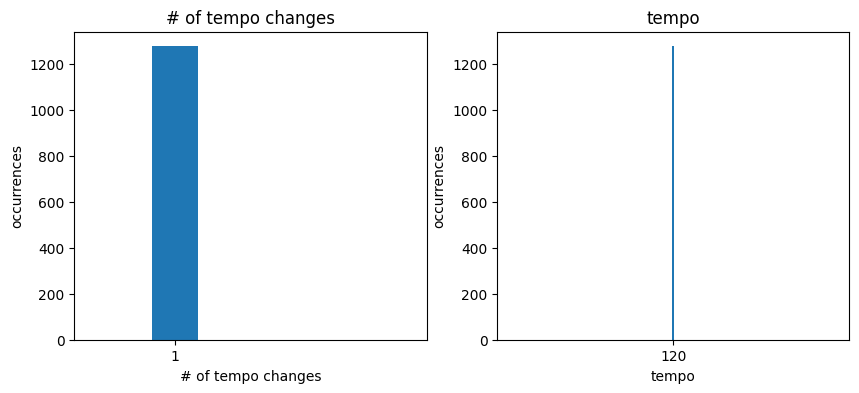

In [ ]:
plotting(input1 = [len(s['tempos']) for s in statistics],
             input2 = [i for s in statistics for i in s['tempos']],
             bin1 = [0, 5, 1], bin2 = [20, 220, 1],
             title1 = '# of tempo changes', title2 = 'tempo')

We can see that, in each MIDI file, only one tempo (120 bpm) is being used.

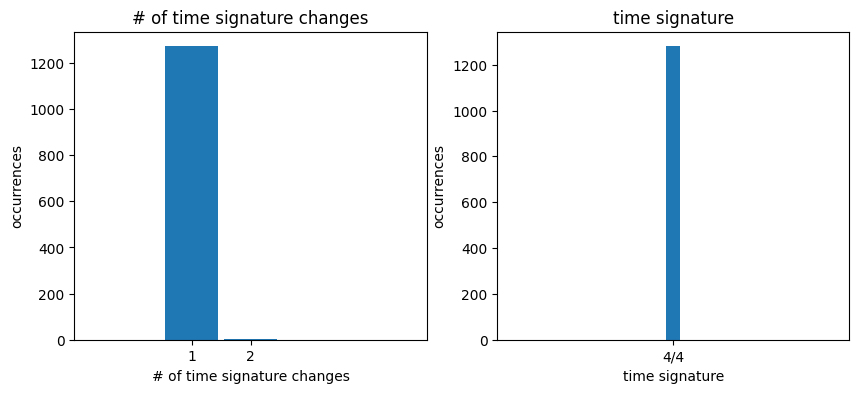

In [ ]:
plotting(input1 = [len(s['time_signature_changes']) for s in statistics],
             input2 = ['{}/{}'.format(c.numerator, c.denominator)
                      for s in statistics for c in s['time_signature_changes']],
             bin1 = [0, 4, 1], bin2 = [-10, 10, 1],
             title1 = '# of time signature changes', title2 = 'time signature')

We can see that, in each MIDI file, only one time signature is being used (4/4).

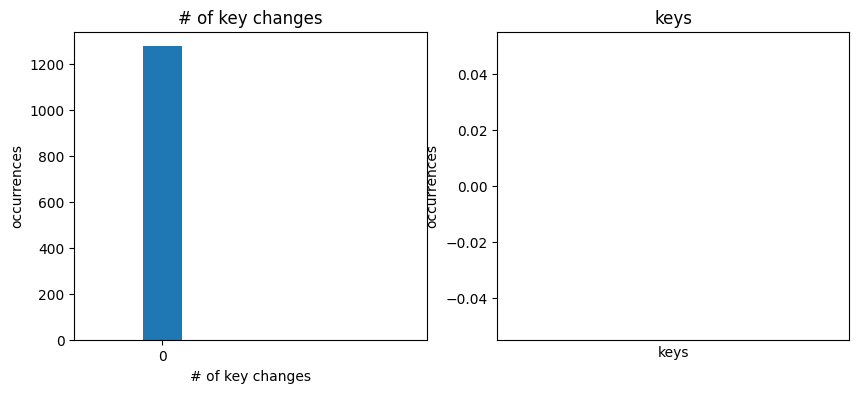

In [ ]:
plotting(input1 = [len(s['key_numbers']) for s in statistics],
             input2 = [i for s in statistics for i in s['key_numbers']],
             bin1 = [-1, 5, 1], bin2 = [-1, 10, 1],
             title1 = '# of key changes', title2 = 'keys')

We can see that no keys or key changes are tracked in the MIDI files provided.

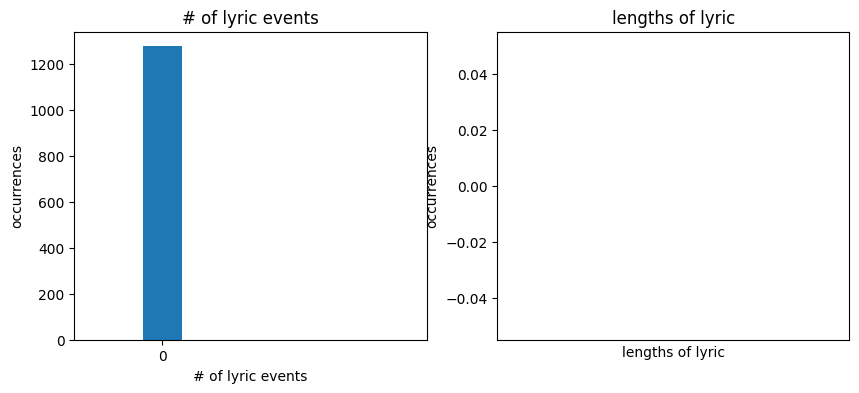

In [ ]:
plotting(input1 = [len(s['lyrics']) for s in statistics],
             input2 = [len(l) for s in statistics for l in s['lyrics']],
             bin1 = [-1, 5, 1], bin2 = [-1, 10, 1],
             title1 = '# of lyric events', title2 = 'lengths of lyric')

We can see that no lyrics are stored in the MIDI files provided.

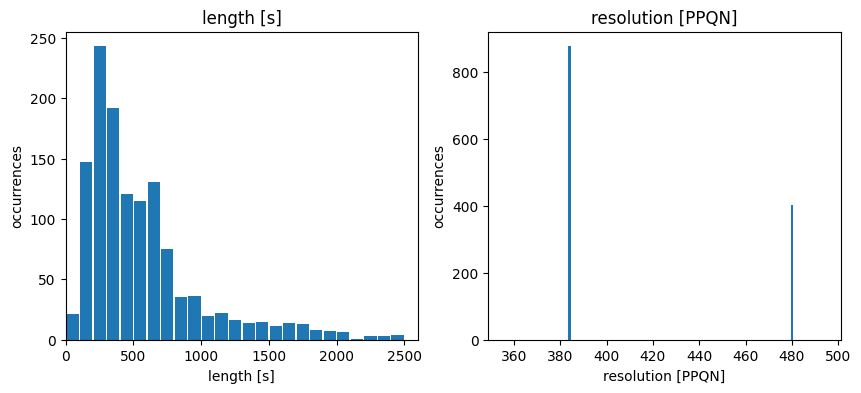

In [ ]:
plotting(input1 =[s['end_time'] for s in statistics],
             input2 = [s['resolution'] for s in statistics],
             bin1 = [0, 2600, 100], bin2 = [350, 500, 1],
             title1 = 'length [s]', title2 = 'resolution [PPQN]', meaningful_ticks=False)

We can also see that:
- the lengths of the pieces/MIDI files have a nice variety
- only two values of MIDI file resolution are used: 384 and 480 PPQN (pulses per quarter note)

The limitations shown in this section will be reflected in the music that will be generated by the NN model trained on this dataset.
The generative model will be simple (because of only one instrument) and flexible in terms of length, but will incur in the following limitations:
- using only one fixed instrument (acoustic grand piano)
- a fixed tempo (120 quarter notes per minute)
- a fixed time signature (4/4)
- an impossibility to specify the key
- an impossibility to work with lyrics
- a limited range of resolutions (384 or 480 PPQN)

## **1.2 Dataset preprocessing**

We now want to start processing the data that will be inputed to the ML algorithm.
There are two main tasks:
1. discretizing the temporal aspect of the notes, with a sensitivity of $1/16 \; \text{bar} = 1/8 s = 0.125 s$ and creating a piano-roll for each instrument in each file

2. separating chords and melody, by first identifying chords and subtracting them from the piano roll, so that the remaining notes consitute the melody

3. shifting all the possible notes to a fixed range, between C4 (60) and B5 (83), and turning the chords in a shorter, 13-dimensional encoding

## **1.2.1 Discretization and piano roll**

In [ ]:
def custom_round(input, w):
    '''
    function that divides the input by w and rounds the input value to multiples of w
    '''
    # by rounding down if the reminder of the division by w is less than w/2
    if (input % w)<w/2:
        return int(input // w)
    # and rounding up if the reminder of the division by w is more than w/2
    else:
        return int(input // w)+1

In [ ]:
def plot_in_quarters(obj, title = 'piano roll', xlabel='time [1 unit=1/16 bar]'):
    '''
    function that plots the piano roll by splitting it in 4 lines
    '''
    _, ax = plt.subplots(nrows=4, ncols=1, figsize=(20, 8))
    for k in range(4):
        l = int(np.floor(np.shape(obj)[1]) /4)
        ax[k].imshow(obj)
        ax[k].set_xlim(k*l,(k*l+l))
        ax[k].set_ylabel('MIDI note')
    ax[0].set_title(title + ' up to '+str(np.shape(obj)[1])+' units')
    ax[3].set_xlabel(xlabel)

In [ ]:
def custom_piano_roll(filename, w=0.125, tot_notes=128, plot=False):
    '''
    function that, given a filename, computes the binary discretized piano roll that
    - has sensitivity of w [bars]
    - displays tot_notes notes
    - can be displayed if plot=True
    - if the plot is shown, it only prints up to end_plot indexes
    '''
    # firstly, we need to load and extract the instument information, which is a list
    # of note objects
    pm = pretty_midi.PrettyMIDI(filename)
    temp = pm.instruments[0]
    # then we order these note objects in ascending order of their starting time
    notes_sorted_by_start = sorted(temp.notes, key=lambda note: note.start)
    # and compute the time corresponding to the beginning of the song as the
    # first/minimum starting time
    offset = notes_sorted_by_start[0].start
    # we also need to compute the end of the song for storage initialization purposes
    # we do this by sorting the note objects, this time in descending order of their
    # decreasing time
    notes_sorted_by_end = sorted(temp.notes, key=lambda note: note.end, reverse=True)
    # and computing the end of the song as the end of the last note
    last = notes_sorted_by_end[0].end - offset
    # we adjust this for the initial offset and round to multiples of the input/chosen
    # sensitivity w
    idx_max = custom_round(last, w)
    # we can finally initialize the matrix (i.e. piano roll) in which we are going to
    # record the binary discretized info
    # - each row of the matrix correspond to a possible note
    # - each column corresponds to a disretized time index (in custom units)
    matrix = np.zeros((tot_notes, idx_max+1))
    # we will check if the note is played in the end of a music piece to handle correctly
    # this case
    end_of_piece = matrix.shape[1]
    # while going through the notes, we want to have an estimate of the number of
    # notes that are deleted before
    # of the discretization which discards notes that have lenght less than w/2
    deleted_notes = 0
    # for every note in the note object
    for note in notes_sorted_by_start:
        # we adjust the start of the note for the initial offset and round to multiples of
        # the input/chosen sensitivity w
        start_idx = custom_round(note.start - offset, w)
        # and round off the duration to multiples of the input/chosen sensitivity w
        duration_idx = custom_round(note.end - note.start, w)
        # we only need to update the piano roll if the rounded up note duration is non-null
        if duration_idx!=0:
            # if the note is valid, we update the piano roll by turning the time indexes
            # - covered by the note
            # - for the specific pitch of the note
            # from zeros to ones
            # here we check also if the note is played till the end of the music piece
            if not (duration_idx + start_idx >= end_of_piece):
              matrix[note.pitch, start_idx:(start_idx+duration_idx+1)] = np.ones((1, duration_idx+1))
            else:
              matrix[note.pitch, start_idx:end_of_piece] = np.ones((1, end_of_piece-start_idx))
        else:
            # if the note is discarded, we increase the counter
            deleted_notes +=1
    # the piano roll and discarded notes counter are displayed
    if plot:
        print('by discretizing with sensitivity '+str(w)+' bar, we ended up discarding ',
                deleted_notes, ' notes out of ', len(notes_sorted_by_start))
        plot_in_quarters(matrix, title = 'piano roll', xlabel='time [1 unit=1/16 bar]')
    return matrix

## **1.2.2 Identifying and separating chords and melody**

In [ ]:
def check_if_chord(triplet):
  '''
  function that checks if the structure that is characteristic of chords is respected by the
  input triplet, and returns a boolean value corres
  '''
  # fistly, we make sure that the extremes differ by 7
  if (triplet[2] - triplet[0]) == 7:
    # and that the two pairs differ by 4 and 3
    if (triplet[1] - triplet[0]) == 4 and (triplet[2] - triplet[1]) == 3:
      return True
    elif (triplet[1] - triplet[0]) == 3 and (triplet[2] - triplet[1]) == 4:
      return True
  # if the conditions are not met, then
    else:
      return False
  else:
    return False

In [ ]:
def find_right_triplets(filename):
  '''
  function that, given a filename, returns a list of the triplets that are compatible with the
  chord structure: each triplet is identified by a tuple containing
  - a list of the notes
  - the corresponding time index
  it also outputs the full piano roll matrix mat, since we will need it later and we dont' want
  to compute it twice
  '''
  # firstly, we get the piano roll
  mat = custom_piano_roll(filename)
  # firstly, we compute the number of notes active at a certain time index
  temp = np.sum(mat, axis=0)
  # and are intrested only in the time indexes that had 3 or more notes active, since
  # all chords
  # - are a composition of 3 notes
  # - are such that the last and first notes differ by 7 notes
  t_chords = np.where(temp>=3)[0]
  # we initialize the storage used to save the triplets that are compatible
  right_triplets = []
  # for each interesting time index
  for t in t_chords:
      # we isolate the piano roll pixels corresponding to that time index
      vect = mat[:,t]
      # and find out the indexes of the notes
      chord_notes = np.where(vect==1)[0]
      # for each possible combination of the activated notes
      for triplet in itertools.combinations(chord_notes, 3):
        # we check if it constitutes a chord based on the previously defined function
        if check_if_chord(triplet):
          # print(t, triplet, 'good, from > three notes')
          # and print it
          right_triplets.append((list(triplet), t))
  # the triplets just found aren't necessarily chords, since they have specific structures,
  # which also help us identifying the name of the chord
  # (which can be used to create a shorter encoding)
  return right_triplets, mat

To identify the chords, it's helpful to ditch the MIDI note notation and instead exploit the international pitch notation (IPN), consisting of the note and of the octave it belongs to.


In [ ]:
def midi_to_note_name(midi_number, note_names = ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B']):
    '''
    function that, given the MIDI note number, returns the note symbol and octave that,
    together, identify the note in the IPN notation
    '''
    note = note_names[midi_number % 12]
    octave = (midi_number // 12)
    return note, octave

We are now going to analyze each triplet/potential chord to determine if it's an actual chord, based on a dataframe of all possible chords (`chords_dict`).

In [ ]:
chords_dict = {
'C':['C', 'E', 'G'], 'C#': ['C#', 'E#', 'G#'], 'D': ['D', 'F#', 'A'], 'D#': ['D#', 'G', 'A#'], 'E': ['E', 'G#', 'B'],
'F': ['F', 'A', 'C'], 'F#': ['F#', 'A#', 'C#'], 'G': ['G', 'B', 'D'], 'G#': ['G#', 'C', 'D#'], 'A': ['A', 'C#', 'E'],
'A#': ['A#', 'D', 'F'], 'B': ['B', 'D#', 'G'], 'Cm': ['C', 'D#', 'G'], 'C#m': ['C#', 'E', 'G#'],
'Dm': ['D', 'F', 'A'], 'D#m': ['D#', 'Gb', 'A#'], 'Em': ['E', 'G', 'B'], 'Fm': ['F', 'G#', 'C'],
'F#m': ['F#', 'A', 'C#'], 'Gm': ['G', 'A#', 'D'], 'G#m': ['G#', 'B#', 'D#'], 'Am': ['A', 'C', 'E'],
'A#m': ['A#', 'C#', 'F'], 'Bm': ['B', 'D', 'F#'] }
chords_df = pd.DataFrame(chords_dict).transpose()
chords_df

,0,1,2
C,C,E,G
C#,C#,E#,G#
D,D,F#,A
D#,D#,G,A#
E,E,G#,B
F,F,A,C
F#,F#,A#,C#
G,G,B,D
G#,G#,C,D#
A,A,C#,E


In [ ]:
def chords_check(filename):
    '''
    function that, given a filename, checks if the triplets found in it (compatible with the chord structure)
    are actually chords, and assigns them a name, outputting:
    - actual_chords, a list of chord names
    - chord_octaves, a list of octaves corresponding to the chords, to allow for full reconstruction
    - the full piano roll, since we will need it still after this function and we don't want to compute it twice
    '''
    # firstly, we upload the list of triplets that are compatible with the chord structure
    all_triplets, mat = find_right_triplets(filename)
    # then we initialize the output storage
    actual_chords = []
    chord_octaves = []
    for triplet in all_triplets:
        # we extract the name of the first note of the triplet
        note0, octave0 = midi_to_note_name(triplet[0][0])
        note1, octave1 = midi_to_note_name(triplet[0][1])
        note2, octave2 = midi_to_note_name(triplet[0][2])
        # we check if any chord in the chord_dataframe matches all columns and, if so, we find its location
        chord_id = np.where((chords_df[0]==note0) & (chords_df[1]==note1) & (chords_df[2]==note2))[0]
        if len(chord_id)!=0:
            # and save it
            actual_chords.append((chords_df.index.values[chord_id[0]], triplet[1]))
            chord_octaves.append([octave0, octave1, octave2])
    return actual_chords, chord_octaves, mat

Now that we have all the chords, we can subtract them from the piano roll to obtain the actual melody: to perform this subtraction we need to go back to the MIDI notation for notes

In [ ]:
def note_name_to_midi(note_name, octave, note_names = ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B']):
    '''
    function that, given the MIDI note number, returns the note symbol and octave that, together, identify the
    note in the IPN notation
    '''
    note = list(np.where(note_name == np.array(note_names))[0])[0]
    return note + (octave+1)*12

The melody should be good in this binary matrix format for ML, except maybe for the notes to be compressed from all octaves to 2 octaves between C4 and B5, but it might be fine without it.

But for the chords we can instead make a shorter, 13 dimensional encoding, to feed to the ML algorithm.

In [ ]:
def melody_chords_piano_roll(filename, chords_plot=False, melody_plot=False):
    '''
    function that, given a filename,returns the following piano rolls:
    - melody_mat, with just the melody (no chords) of the music piece
    - chords_mat, with just the chords of the music piece
    - actual_chords, the chord list
    - mat, the full piano roll
    '''
    # firstly, we get the lists of chord_names and octaves corresponding to the actual chords, and the piano roll
    actual_chords, chord_octaves, mat = chords_check(filename)
    # firstly, we duplicate the piano roll
    melody_mat = copy.deepcopy(mat)
    # for each chord found
    for j, chord in enumerate(actual_chords):
        # we first extract the time index
        idx = chord[1]
        chord_notes = list((chords_df.values)[np.array(chords_df.index ) == chord[0]][0])
        # we get the corresponding 3 notes, particularly their MIDI pitch number
        pitch = [note_name_to_midi(chord_notes[i], chord_octaves[j][i]) for i in range(3)]
        # we deactivate the corresponding pixels from the piano roll
        melody_mat[pitch, idx] = np.zeros((len(pitch)))
    chords_mat = mat-melody_mat
    # and the output should be the melody piano roll
    if chords_plot:
        print(len(actual_chords), ' chords were found.')
        plot_in_quarters(chords_mat, title = 'chords piano roll', xlabel='time [1 unit=1/16 bar]')
    if melody_plot:
        plot_in_quarters(melody_mat, title = 'melody piano roll', xlabel='time [1 unit=1/16 bar]')
    return melody_mat, chords_mat, actual_chords, mat

46  chords were found.


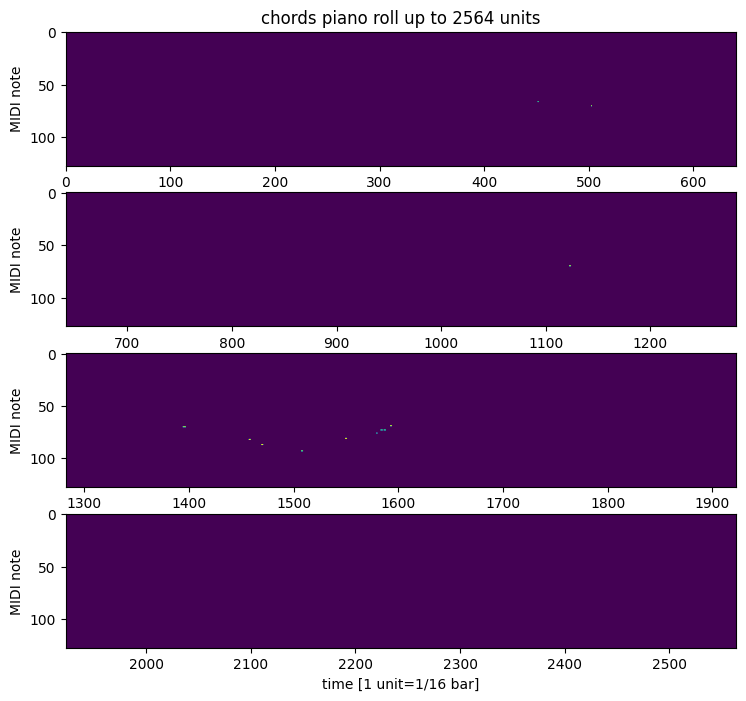

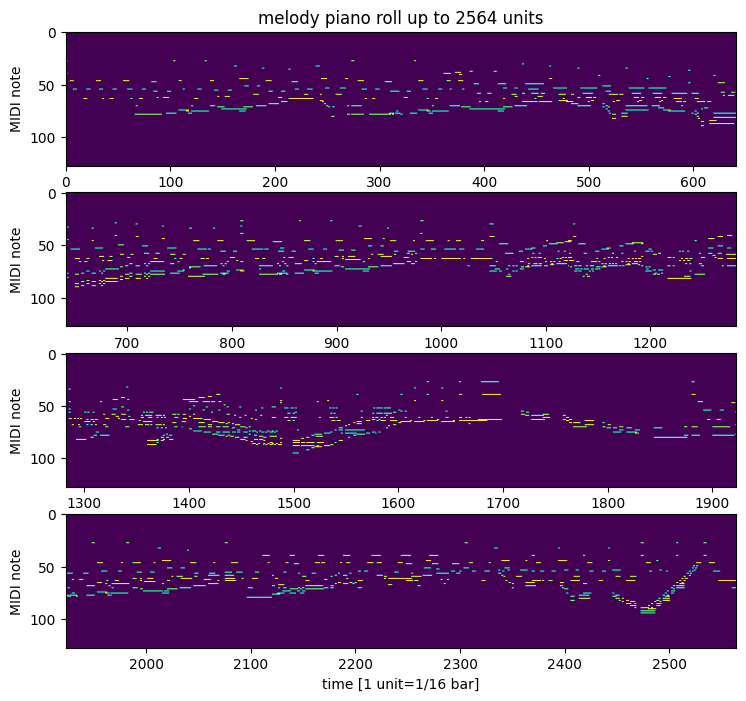

In [ ]:
sorted_filenames = sorted(filenames)
filename = sorted_filenames[23]
melody_mat, chords_mat, actual_chords, mat = melody_chords_piano_roll(filename, chords_plot=True, melody_plot=True) # the actual interesting part is melody_mat

### **1.2.3 Encoding the Chords**

We want to reduce the dimensionality of the chords piano roll from 128 to a 13, based on a 13-dimensional encoding of the chord names, following the following chart


<sample src="chords_conv.png"
     width=50%/>

In [ ]:
# to find the mathematical form of the encoding, we first check if a chord is minor chord
dim13 = [int(cn[-1]=='m') for cn in chords_df.index.values]
# after saving it, we remove the minor symbol to make the next calculations easier
temp = [cn[:-1] if (cn[-1]=='m') else cn for cn in chords_df.index.values]
# and we're able to initialize the first 12 coordinates
dim112 = np.unique(temp)
chords_encoding_mat = [ [int(cn==r) for r in dim112] + [dim13[i]] for i, cn in enumerate(temp)]
chords_encoding_df = pd.DataFrame(chords_encoding_mat, index = chords_df.index.values)
display(chords_encoding_df)

,0,1,2,3,4,5,6,7,8,9,10,11,12
C,0,0,0,1,0,0,0,0,0,0,0,0,0
C#,0,0,0,0,1,0,0,0,0,0,0,0,0
D,0,0,0,0,0,1,0,0,0,0,0,0,0
D#,0,0,0,0,0,0,1,0,0,0,0,0,0
E,0,0,0,0,0,0,0,1,0,0,0,0,0
F,0,0,0,0,0,0,0,0,1,0,0,0,0
F#,0,0,0,0,0,0,0,0,0,1,0,0,0
G,0,0,0,0,0,0,0,0,0,0,1,0,0
G#,0,0,0,0,0,0,0,0,0,0,0,1,0
A,1,0,0,0,0,0,0,0,0,0,0,0,0


We can now use this encoding to create a smaller chords piano roll

In [ ]:
def get_encoded_chords(filename, chords_encoding_df):
    '''
    function that reduces the chords piano roll (128 by t_max) into a much small matrix
    (13 by t_max) by encoding each chord into a unique combination of 13 coordinates
    '''
    actual_chords, _, mat = chords_check(filename)
    # the time dimension (number of columns) will be the same as in the piano roll,
    # but there will be fewer rows
    encoded_chords = np.zeros((13, np.shape(mat)[1]))
    for chord in actual_chords:
        encoded_chords[:, chord[1]] = np.array(chords_encoding_df[chords_encoding_df.index.values == 'F#'])[0]
    return encoded_chords

In [ ]:
encoded_chords = get_encoded_chords(filename, chords_encoding_df)
encoded_chords

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

### **1.2.4 Encoding the Melody**

Lastly, we can shift all the possible notes to a fixed range, between C4 (60) and B5 (83), by looking at the IPN notation and approximating the octave of the note to 4 or 5.

In [ ]:
def fixed_range_pitch(original_pitch):
    '''
    function that approximates the range of MIDI notes to a fixed range between C4 and B5
    by approximating all notes with:
    - octave <= 4 with the corresponding note in the 4th octave
    - octave >= 5 with the corresponding note in the 5th octave
    '''
    note, octave = midi_to_note_name(original_pitch)
    if octave<=4:
        return note_name_to_midi(note, 4)
    else:
        return note_name_to_midi(note, 5)

In [ ]:
def get_fixed_range_melody_piano_roll(filename, plot_output=False, title='fixed range melody piano roll'):
    '''
    function that takes a piano roll matrix mat and changes all the pitches of the notes to a fixed range
    based on the previously defined function fixed_range_pitch
    '''
    # firstly, we get the melody_matrix corresponding to the filename
    melody_mat, _, _, _ = melody_chords_piano_roll(filename)
    # and we initialize the output matrix to be null and match the shape of the initial melody piano roll
    fixed_range_melody_mat = np.zeros_like(melody_mat)
    # we get the conversion from the MIDI range to restricted range
    original_notes = np.arange(np.shape(melody_mat)[0], dtype=int)
    fixed_range_notes = np.array([fixed_range_pitch(on) for on in original_notes])
    # we restrict our loop to the interesting instant of times, in which at least one note is playing
    music_on = np.where(melody_mat.sum(axis=0) > 0)[0]
    # at each of these times:
    for t in music_on:
        # we traslate the pitch to the fixed range
        temp = fixed_range_notes[np.array(melody_mat[:,t]==1)]
        # and update the locations of the output piano roll matrix to be active (i.e. 1s)
        fixed_range_melody_mat[temp, t] = np.ones_like(temp)
    if plot_output:
        plot_in_quarters(fixed_range_melody_mat, title = title)
    return fixed_range_melody_mat

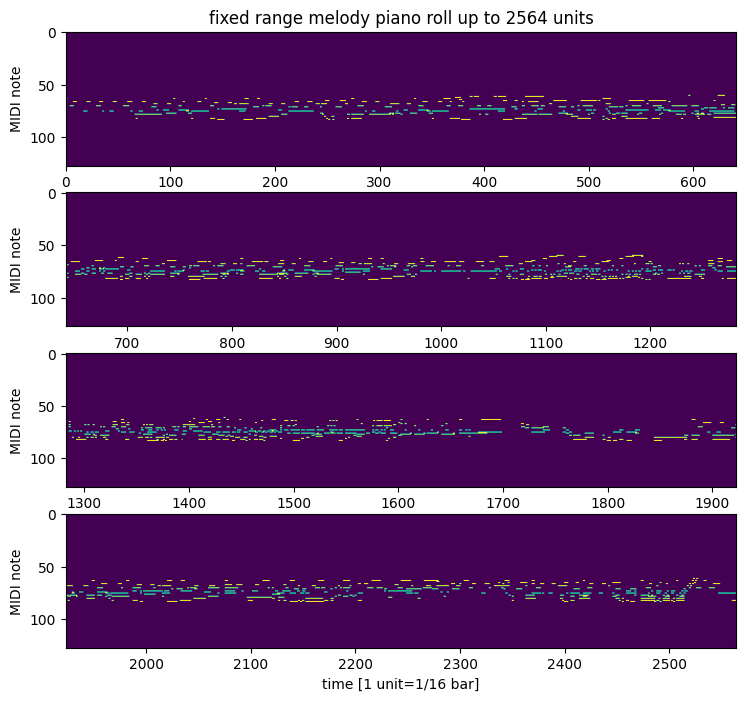

In [ ]:
fixed_range_melody_mat = get_fixed_range_melody_piano_roll(filename, plot_output=True)

## **1.3 Saving the preprocessed melody matrices**
Particularly, we save each one in a specific file, and split them into train and test sets by storing them in different folders based on the following proportions:
- 80% for training
- 20% for testing

Since we are only interested in melody generation, we save only the melody matrices.

In [ ]:
# firstly, we set a seed to allow for replicability purposes
seed = 12345
np.random.seed(seed)
# and we make sure that the files are sorted and in the same order also before the permutation
filenames_sorted = sorted(filenames)
num_files = len(filenames_sorted)
print('the total number of MIDI files available is: ', num_files)
# so they will also be aligned after the permutation
random.shuffle(filenames_sorted)
# we split the dataset in 2 in order to dedicate 20% to a test set
test_percent = 0.2
# and find the indexes of the data corresponding to the end of each split
train_ind = int((1-test_percent)*num_files)
print('the number of files in the training set is: ', train_ind)
print('the number of files in the testing set is: ', num_files-train_ind+1)
# based on the previous thresholds, we split the filenames by set
train_files = filenames_sorted[:train_ind]
test_files = filenames_sorted[train_ind:]
# if saving needs to occur
if make_dataset_dir:
  # we create the necessary directories
  os.makedirs(dataset_dir, exist_ok=True)
  os.makedirs(dataset_dir + '/train', exist_ok=True)
  os.makedirs(dataset_dir + '/test', exist_ok=True)

  #for each training file
  for i, file in enumerate(train_files):
    # we try to apply the data pre-processing explained in the previous section
    try:
      # melody_mat, _, _, _ = melody_chords_piano_roll(file) # this was full range of notes

      # particularly, we restrict the range of notes to a fixed range, since it's
      # necessary for the data augmentation function (used later) to work
      melody_mat = get_fixed_range_melody_piano_roll(file)
      tensor = torch.from_numpy(melody_mat)
      file_path1 = os.path.join(dataset_dir + '/train', 'melody_' + str(i) + '.pth')
      torch.save(tensor, file_path1)
    # otherwise, we signal an error with the file
    except: print('Problematic file in train:' + str(i))

  # for each test file
  for i, file in enumerate(test_files):
    # we try to apply the data pre-processing explained in the previous section
    try:
      melody_mat = get_fixed_range_melody_piano_roll(file)
      tensor = torch.from_numpy(melody_mat)
      file_path3 = os.path.join(dataset_dir + '/test', 'melody_' + str(i + train_ind) + '.pth')
      torch.save(tensor, file_path3)
    # otherwise, we signal an error with the file
    except: print('Problematic file in test:' + str(i))
  # we signal that we've gone through all the possible files
  print("Directory created successfully!")
else:
      print("Directory already made!")

the total number of MIDI files available is:  1276
the number of files in the training set is:  1020
the number of files in the testing set is:  257
Directory already made!


# **2 .Building the Generative Adversarial Network (GAN)**
based on the following article:

[*MidiNet: A Convolutional Generative Adversarial Network for Symbolic-domain Music Generation*, Li-Chia Yang, Szu-Yu Chou, Yi-Hsuan Yang, 2017](https://arxiv.org/abs/1703.10847)



**MidiNet** is a modified deep Convolutional GAN (DC-GAN): like regular GANs, it aims at learning:
- a generator G, which goal is to artificially generates data that is indistinguishable from the authentic one
- a discriminator D, which goal is to distinguish between authentic and artificially generated data

**Feature Matching** is used in MidiNet to address the instability and model-collapse issues typical of GANs training: this technique involves the $L_2$ regularization of the classic GAN learning rule and ensures that the distributions of authentic and generated data are close:
$$ \lambda_1 \| \mathbb{E} X - \mathbb{E} G(z) \|_2^2 + \lambda_2 \| \mathbb{E} f(X) - \mathbb{E} f(G(z)) \|_2^2 $$
where
- $f$ denotes the first convolutional layer of the discriminator
- $\lambda_1=0.1, \lambda_2=1$ are parameters set empirically (see [1]).

<span style="color:red"> MidiNet also uses **One-sided label smoothing**, which consists of not labelling samples as either 0s or 1s but with intermediate values, to prevent the model from being overly confident. Unlike standard label-smoothing (in which both classes are smoothed), only the incorrect class is smoothed, leaving the true class with a probability of 1. This only reduces confidence in the incorrect classes, and results in a less aggressive approach that helps prevent overfitting.



## **2.1 Creating the custom dataset class**
which:
- loads the data
- performs random data augmentation after loading (to avoid storing more files than necessary)
- selects only 2 consequent bars per file loaded, since our GAN will input only 2 consequent bars of music


### **2.1.1 Melody piano roll augmentation**

After performing the fixed range ([C4, B5]=[60,83]) approximation above (as seen in [1]), we realize that our dataset is limited and that the GAN would probably produce notes only in this range if trained only with this kind of data.

Because of this reason and because of the limited amount of MIDI data available, we decide to perform data augmentation.

Specifically, we modify the fixed-range melody matrices obtained from real data and shift all notes by one or more octaves,
compatibly with the range of notes that can be played on a piano ([A0, C8]=[21, 108]).

To avoid having to store more data than necessary, this data augmentation strategy is not performed when the melody matrix/piano roll is first preprocessed and saved. Instead, it will be applied when those melody piano rolls are loaded with Pytorch's DataLoader.

Additionally, only a set fraction $p$ of the melody piano rolls will be randomly augmented.

In [ ]:
def data_augmentation(fixed_range_melody_mat):
    '''
    function that, given a fixed-range melody_matrix, performs data augmentation by
    shifting the reduced range of notes in the melody by one or more bars
    (based on the observation that to shift by a bar means to shift by 12 notes)
    '''
    # given that these files are played on piano (which notes are limited in [A0, C8]=[21,108]),
    # the possible bar-wide shifts of range from the [C4, B5]=[60, 83] are:
    shifts = [-3, -2, -1, +1, +2]
    # after randomly choosing the shift:
    shift = shifts[ np.random.randint(0, len(shifts)) ]
    # we modify the piano roll by removing 12 (empty) rows from one side of the piano roll and
    # adding 12 (empty) rows to its opposite side
    # if the shifts are to "smaller" notes
    if shift<0:
        # the rows are removed from the beginning, and are added to the end
        augmented_melody_mat = np.concatenate( [fixed_range_melody_mat[12*np.abs(shift):,:],
                                                np.zeros((12*np.abs(shift), np.shape(fixed_range_melody_mat)[1])) ] )
    else:
        # the rows are removed from the end, and are added to the beginning
        augmented_melody_mat = np.concatenate( [np.zeros((12*np.abs(shift), np.shape(fixed_range_melody_mat)[1])),
                                                fixed_range_melody_mat[:-12*np.abs(shift),:] ] )
    # in either case, we return the shifted matrix
    return augmented_melody_mat

In [ ]:
class Custom_Dataset(Dataset):
    def __init__(self, directory, bar_width=16, p=0.5, aug=False):
        '''
        custom dataset class that randomly samples pairs of two consecutive bars from each file,
        with added all zero bar before each tab
        - the number of pairs of bars per each file is equal to number of bars in the file // 2

        '''
        self.directory = directory
        self.file_list = [f for f in os.listdir(directory)]
        self.bar_width = bar_width
        self.p = p
        self.aug = aug
        self.piano_rolls = self._load_piano_roll()
        self.pairs = self._slice_bars()

    def _load_piano_roll(self):
        '''
        method for loading all piano rolls from all the files
        '''
        piano_rolls = []
        for filename in self.file_list:
            # load a piano roll from a file
            file_path = os.path.join(self.directory, filename)
            piano_roll = torch.load(file_path)
            piano_rolls.append(piano_roll)
        return piano_rolls

    def _slice_bars(self):
        '''
        method that:
        - slices the piano rolls into pairs of data
        - perfors random data augmentation (with probability p) of the piano rolls
          and then slices the augmented piano roll also into pairs

        each pair is a tuple (bar1, bar2) where
        - bar1 will be used in G as a 2D condition
        - bar2 is an instance of real data in G and is also the input of D
        '''
        pairs = []
        for piano_roll in self.piano_rolls:
            # add a zero bar before the tab
            zero_bar = torch.zeros((piano_roll.shape[0], self.bar_width))
            padded_piano_roll = torch.cat((zero_bar, piano_roll), dim = 1)

            # define number of bars present in the file
            number_of_bars = piano_roll.shape[1] // self.bar_width

            for i in range(number_of_bars -1):
                bar1 = padded_piano_roll[:, i*self.bar_width:(i+1)*self.bar_width]
                bar2 = padded_piano_roll[:, (i+1)*self.bar_width:(i+2)*self.bar_width]

                bar1 = torch.tensor(bar1, dtype=torch.float32).unsqueeze(0)
                bar2 = torch.tensor(bar2, dtype=torch.float32).unsqueeze(0)
                pairs.append((bar1, bar2))

            # we randomly choose when to apply data augmentation, which is processed
            # similarly to before, with probability p
                if self.aug:
                    if (np.random.random()>self.p):
                        aug_piano_roll = data_augmentation(padded_piano_roll)
                        aug_bar1 = aug_piano_roll[:, i*self.bar_width:(i+1)*self.bar_width]
                        aug_bar2 = aug_piano_roll[:, (i+1)*self.bar_width:(i+2)*self.bar_width]
                        aug_bar1 = torch.tensor(aug_bar1, dtype=torch.float32).unsqueeze(0)
                        aug_bar2 = torch.tensor(aug_bar2, dtype=torch.float32).unsqueeze(0)
                        pairs.append((aug_bar1, aug_bar2))

        return pairs

    def __len__(self):
        return len(self.pairs)

    def __getitem__(self, idx):
        two_bars = self.pairs[idx]

        return two_bars

In [ ]:

# we initialize the batch size (so that all batches are full batches)
batch_size = 51
# and the directories for the 3 sets
set_names = ['train', 'test']
train_dir = dataset_dir + '/train'
test_dir = dataset_dir + '/test'
# and apply our custom class to each directory
train_dataset_no_aug = Custom_Dataset(train_dir, aug=False)
train_dataset_aug = Custom_Dataset(train_dir, aug=True)
test_dataset = Custom_Dataset(test_dir)
# these classes are used to set up a PyTorch DataLoader's objects for each set
# train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True, drop_last = True)
# train_loader_no_aug = DataLoader(train_dataset_no_aug, batch_size=batch_size, shuffle=True, drop_last = True)
# train_loader_aug = DataLoader(train_dataset_aug, batch_size=batch_size, shuffle=True, drop_last = True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True, drop_last=True) # was shuffle=False

# we try to use a GPU (if the device has a cuda-compatible GPU) and otherwise resort to the CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

C:\Users\ecica\AppData\Local\Temp\ipykernel_11408\967957485.py:25: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  piano_roll = torch.load(file_path)
C:\Users\ecica\AppData\Lo

In [ ]:
# print('the number of training pairs without data augmentation is: ', len(train_loader_no_aug) )
# print('the number of training pairs with data augmentation is: ', len(train_loader_aug) )
print('the number of test pairs is: ', len(test_loader) )

the number of test pairs is:  2794


## **2.2 Conditioned Generator CNN in MIDINet**
- inputs a vector $z$ of random noises
- outputs a matrix consisting of artificially generated melody piano rolls
- consists of
    - two fully connected layers (with 1024 and 512 neurons respectively)
    - four transposed convolutional layers:
        - the first three use filters of shape 1-by-2 and two strides
        - the last layer uses filters of shape 128-by-1 and one stride.
- uses batch normalisation between layers

We included the conditioning inside the Generator CNN, since they are to be trained simultaneously and share the same gradients.

In [ ]:
def _init_weights(m):
    '''
    function that initializes the weights of the Generator, based on the Glorot/Xavier
    uniform initialization criteria
    '''
    if isinstance(m, (nn.Linear, nn.Conv2d, nn.ConvTranspose2d)):
        torch.nn.init.xavier_uniform_(m.weight, gain=1.0)
        # we make sure that, if the bias exist, they are initialized to zero
        if m.bias is not None:
            m.bias.data.zero_()

In [ ]:
class Generator(nn.Module):
    '''
    CNN learner class with the following attributes/methods:
    - z_dim: dimension of the input noise vector
    - out_channels: number of channels in the output (1 for binary piano roll)
    '''
    def __init__(self, z_dim = 100, out_channels = 1):
        super().__init__()

        self.z_dim = z_dim
        self.out_channels = out_channels

        # we start defining the actual model by defining and combining all 3 of the fully
        # connected layers, which perform batch normalization and reshape the final
        # output into 256 channels of 1 by 2 matrices
        self.fully_connected_net = nn.Sequential(
            nn.Linear(z_dim, 1024),
            nn.BatchNorm1d(1024),
            nn.LeakyReLU(),
            nn.Linear(1024, 512),
            nn.BatchNorm1d(512),
            nn.LeakyReLU(),
            nn.Linear(512, 256*1*2))

        # we then add the transposed convolutional layers
        # the input size of each one is 512=256+256, because its input will be the
        # concatenation of the a bar x and of its previous_bar
        self.trconv1 = nn.Sequential(
            nn.ConvTranspose2d(512, 256, kernel_size = (1,2), stride = 2),
            nn.BatchNorm2d((256)),
            nn.LeakyReLU())

        self.trconv2 = nn.Sequential(
            nn.ConvTranspose2d(512, 256, kernel_size = (1,2), stride = 2),
            nn.BatchNorm2d((256)),
            nn.LeakyReLU())

        self.trconv3 = nn.Sequential(
            nn.ConvTranspose2d(512, 256, kernel_size = (1,2), stride = 2),
            nn.BatchNorm2d((256)),
            nn.LeakyReLU())

        self.trconv4 = nn.ConvTranspose2d(512, self.out_channels,
                                          kernel_size = (128,1), stride = 1)

        # we can finally define the layers that are responsible for conditioning on the
        # previous bar, which corresponds to the Conditioner CNN
        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 256, kernel_size = (128,1), stride = 1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU())

        self.conv2 = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size = (1,2), stride = 2),
            nn.BatchNorm2d(256),
            nn.LeakyReLU())

        self.conv3 = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size = (1,2), stride = 2),
            nn.BatchNorm2d(256),
            nn.LeakyReLU())

        self.conv4 = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size = (1,2), stride = 2),
            nn.BatchNorm2d(256),
            nn.LeakyReLU())

    # lastly, we define the forward method
    def forward(self, z, previous_bar):
        # firstly, we pass previous_bar through all the convolutional layers of the
        # conditioner, storing the intermediate outputs of each convolutional layer,
        # as we will need them later on
        previous_bar_cond1 = self.conv1(previous_bar)
        previous_bar_cond2 = self.conv2(previous_bar_cond1)
        previous_bar_cond3 = self.conv3(previous_bar_cond2)
        previous_bar_cond4 = self.conv4(previous_bar_cond3)

        # we get the output of all the fully connected layers
        x = self.fully_connected_net(z)
        # and reshape it into 256 channels of 1 by 2 matrices
        x = x.view(x.size(0), 256, 1, 2)
        # we can perform 2D conditioning by concatenatating
        # - the reshaped output of the fully connected layers
        # - with the result of passing previous_bar through the conditioner
        #   (i.e. through all 4 convolutional layers)
        x = torch.cat([x, previous_bar_cond4], dim=1)

        # the concatenation is passed through the first transposed convolutional layer
        x = self.trconv1(x)
        # similarly to before, we perform 2D conditioning by concatenating
        # - the output of this first transposed convolutional layer
        # - with the result of passing previous_bar through the first 3 convolutional layers
        #   of the conditioner
        x = torch.cat([x, previous_bar_cond3], dim=1)

        # the concatenation is passed through the second transposed convolutional layer
        x = self.trconv2(x)
        # once again, we perform 2D conditioning by concatenating
        # - the output of the second transposed convolutional layer
        # - with the result of passing previous_bar through the first 2 convolutional layers
        #   of the conditioner
        x = torch.cat([x, previous_bar_cond2], dim=1)

        # the concatenation is passed through the third transposed convolutional layer
        x = self.trconv3(x)
        # again, we perform 2D conditioning by concatenating
        # - the output of the third transposed convolutional layer
        # - with the result of passing previous_bar through the first convolutional later
        #   of the conditioner
        x = torch.cat([x, previous_bar_cond1], dim=1)

        # lastly, the concatenation is passed through the fourth and last transposed
        # convolutional layer, and a sigmoid function is applied
        # x = torch.sigmoid(self.trconv4(x))
        x = torch.tanh(self.trconv4(x))
        return x

In [ ]:
# we can now call the Generator class, defined above, to initialize an instance
G = Generator().to(device)
# and apply the custom defined weight initialization function to it
G.apply(_init_weights)

# we choose the batch size
# for generating a batch of random latent vectors
z = torch.randn(batch_size, 100, device=device)
# based on which we generate a random bar
prev_bar = torch.randn(batch_size, 1, 128, 16, device = device)
# which is used to condition the generation of a new bar (particularly its melody)
generated_melody = G(z, prev_bar)
print(generated_melody.shape)

torch.Size([51, 1, 128, 16])


## **2.3 The Discriminator CNN**
- inputs a music bar
- aims to determine whether or not the input music is original or not
- outputs a probability that
    - is close to 1 for real data X
    - is close to 0 for artificially generated data G(z)
- typically consists of:
    - two convolutional layers
    - two fully-connected layers, the last of which uses a sigmoid activation function to allow for probabilistic interpretation of the output
- batch normalization is performed between layers

In [ ]:
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        # we separate the first convolution layer because we need to use it later in the loss function
        self.first_convolution = nn.Sequential(nn.Conv2d(in_channels=1, out_channels=14, kernel_size=(128, 2), stride=(2,2)),
            nn.BatchNorm2d(14),
            nn.LeakyReLU() )

        self.rest_of_the_model = nn.Sequential(
            nn.Conv2d(in_channels=14, out_channels=77, kernel_size=(1, 4), stride=(2,2)),
            nn.BatchNorm2d(77),
            nn.LeakyReLU(),
            # then we flatten the output of the convolutional layer
            nn.Flatten(),
            # to ultimately use a fully connected layers: this specific function infers
            # in_features after the first call and, after that, becomes a usual nn.Linear,
            # to avoid calculating the number of in_features
            nn.LazyLinear(out_features=1024),
            nn.BatchNorm1d(1024),
            nn.LeakyReLU(),
            # we add extra layer to allow discriminator to output a single probability value
            nn.Linear(in_features=1024, out_features=1),
            nn.Sigmoid() )

    # lastly, we define the forward method, which is simply
    def forward(self, x):
      after_first_convolution = self.first_convolution(x)
      # here we return the final output of the discriminator
      # and the flattened features after the first convolution layer
      return self.rest_of_the_model(after_first_convolution), after_first_convolution.view(after_first_convolution.size(0), -1)

In [ ]:
# similarly to before, we check the performance of the Discriminator by
# defining a random/artificially generated bar
prev_bar = torch.randn(batch_size, 1, 128, 16, device = device)
# firstly, we define an instance D of the Discriminator class defined above
D = Discriminator().to(device)
# and we call D first with a dummy input to allow LazyLinear to infer in_features
print(D(prev_bar)[0].shape)
# we can finally initilize the weights (since LazyLinear has become just Linear)
D.apply(_init_weights)
# and we can infer the probability of the input sample being a real sample
print(D(prev_bar)[0].shape)

torch.Size([51, 1])
torch.Size([51, 1])


In [ ]:
def Generator_loss(real_piano, fake_piano, real_after_one_conv, fake_after_one_conv, lambda_1, lambda_2, device):
  '''
  function that computes the generator loss
  '''
  # by default, BCEWithLogitsLoss calculates average over the batch, so we receive the expectation value
  # basic GAN loss term
  G_loss = nn.BCEWithLogitsLoss()(fake_piano, torch.ones_like(fake_piano, device=device))

  # first added term
  mean_real = torch.mean(real_piano, dim=0)
  mean_fake = torch.mean(fake_piano, dim=0)
  G_loss += lambda_1*torch.norm(mean_real - mean_fake) ** 2

  # second added term
  mean_real_after_one_conv = torch.mean(real_after_one_conv, dim=0)
  mean_fake_after_one_conv = torch.mean(fake_after_one_conv, dim=0)

  G_loss += lambda_2*torch.norm(mean_real_after_one_conv - mean_fake_after_one_conv) ** 2

  return G_loss

## **2.4 Training the GAN**

In [ ]:
# we initialize the following hyper-parameters, based on [1]
num_epochs = 10
lr = 0.0002
betas = (0.5, 0.999)
lambda_1 = 0.1
lambda_2 = 1
noise_dim = 100
n_samples_to_generate = 25

In [ ]:
G = Generator().to(device)
G.apply(_init_weights)

D = Discriminator().to(device)
prev_bar = torch.randn(batch_size, 1, 128, 16, device = device)
# we call D first with a dummy input to allow LazyLinear to infer in_features
print(D(prev_bar)[0].shape)
D.apply(_init_weights)

G_optimizer = optim.Adam(G.parameters(), lr=lr, betas=betas)
D_optimizer = optim.Adam(D.parameters(), lr=lr, betas=betas)
D_real_loss = 0
D_fake_loss = 0
G_loss = 0

D_loss_for_plot = []
G_loss_for_plot = []

torch.Size([51, 1])


In [ ]:
def train_step(data_loader, G, D, G_optimizer, D_optimizer, batch_size, noise_dim, device):
  '''
  function that executes the training step, equivalent to one epoch, by iterating the training of both
  generator and discriminator on each available bar pair
  '''
  for condition_bar, bar in data_loader:

    real_bar = bar.to(device)
    condition_bar = condition_bar.to(device)

    current_batch_size = real_bar.shape[0]
    print(current_batch_size)

    # --- DISCRIMINATOR TRAINING ---
    # we apply one side label smoothing by making real labels not 1, but 0.9
    real_labels = torch.ones((current_batch_size, 1), device=device)*0.9
    fake_labels = torch.zeros((current_batch_size, 1), device=device)

    # first train on a real bar
    D_optimizer.zero_grad()
    real_output, real_after_one_conv = D(real_bar)
    D_real_loss = nn.BCEWithLogitsLoss()(real_output, real_labels)
    D_real_loss.backward()

    # then train on a fake bar
    noise = torch.randn((current_batch_size, noise_dim), device=device)
    ## generate a fake bar with the Generator
    fake_bar = G(noise, condition_bar)
    fake_output, _ = D(fake_bar.detach())
    D_fake_loss = nn.BCEWithLogitsLoss()(fake_output, fake_labels)
    D_fake_loss.backward()
    D_optimizer.step()

    # --- GENERATOR TRAINING ---
    # to weaken the Discriminator, we update the Generator twice for each iteration
    for _ in range(2):

      G_optimizer.zero_grad()
      fake_bar = G(noise, condition_bar)
      fake_output, fake_after_one_conv = D(fake_bar)
      real_output, real_after_one_conv = D(real_bar)
      G_loss = Generator_loss(real_bar, fake_bar, real_after_one_conv, fake_after_one_conv, lambda_1, lambda_2, device)
      G_loss.backward()
      G_optimizer.step()

  return D_real_loss, D_fake_loss, G_loss

In [ ]:
run = False

In [ ]:
if run:
  for epoch in range(num_epochs):

      D_real_loss, D_fake_loss, G_loss = train_step(train_loader, G, D, G_optimizer, D_optimizer, batch_size, noise_dim, device)

      print(f"Epoch [{epoch + 1}/{num_epochs}], Loss D: {D_real_loss + D_fake_loss:.4f}, Loss G: {G_loss:.4f}")
      D_loss_for_plot.append((D_real_loss + D_fake_loss).cpu().detach().numpy())
      G_loss_for_plot.append(G_loss.cpu().detach().numpy())

In [ ]:
# dir = '/content/drive/MyDrive/Colab Notebooks/'
dir = 'C:/Users/ecica/Desktop/2024.10.04_NNaDL_project/'

In [ ]:

if run:
    # we save the results:
    # - the vectors containing the losses
    np.savez(dir + 'losses.npz', D_loss=D_loss_for_plot, G_loss=G_loss_for_plot)
    # - the state dictionary of the generator after training
    torch.save(G.state_dict(), dir+'generator.pth')
else:
    # we load the result from the saved files

    # FOR THE NON-AUGMENTED
    # we recreate the model architecture by loading, into an initialized generator,
    # its state dictionary after training
    G_no_aug = Generator()
    G_no_aug.load_state_dict(torch.load(dir+'generator_no_aug.pth'))
    G_no_aug.to(device)
    G_no_aug.eval()
    # we also retrieve the vectors with the isses
    losses_no_aug = np.load(dir+'losses_no_aug.npz')
    D_loss_no_aug = losses_no_aug['D_loss']
    G_loss_no_aug = losses_no_aug ['G_loss']

    # FOR THE AUGMENTED
    # we recreate the model architecture by loading, into an initialized generator,
    # its state dictionary after training
    G_aug = Generator()
    G_aug.load_state_dict(torch.load(dir+'generator_aug.pth'))
    G_aug.to(device)
    G_aug.eval()
    losses_aug = np.load(dir+'losses_aug.npz')
    D_loss_aug = losses_aug['D_loss']
    G_loss_aug = losses_aug ['G_loss']

C:\Users\ecica\AppData\Local\Temp\ipykernel_11408\28712417.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  G_no_aug.load_state_dict(torch.load(dir+'generator_no_aug.pth

In [ ]:
no_aug_threshold = 0.3
aug_threshold = 0.15

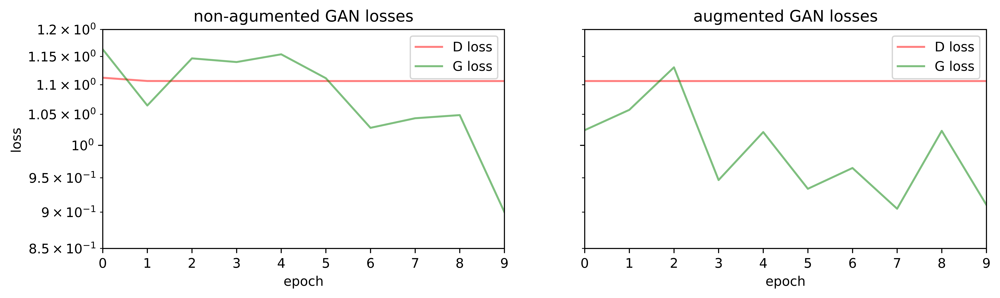

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(12, 3), sharey=True, dpi=1000)
ax[0].plot(D_loss_no_aug, label='D loss', color = 'red', alpha = 0.5)
ax[0].plot(G_loss_no_aug, label='G loss', color = 'green', alpha = 0.5)
ax[0].set_title('non-agumented GAN losses')
ax[0].set_ylim(0.85, 1.2)
ax[0].set_xlim(0, 9)
ax[0].set_xlabel('epoch')
ax[0].set_ylabel('loss')
ax[0].set_yscale('log')
ax[0].legend()

ax[1].plot(D_loss_aug, label='D loss', color = 'red', alpha = 0.5)
ax[1].plot(G_loss_aug, label='G loss', color = 'green', alpha = 0.5)
ax[1].set_title('augmented GAN losses')
ax[1].set_ylim(0.85, 1.2)
ax[1].set_xlim(0, 9)
ax[1].set_xlabel('epoch')
ax[1].set_yscale('log')
ax[1].legend()

plt.show()

# **3. VAE**

Lastly, we decided to experiment by implementing a VAE, which architecture is also CNN-based.

Our VAE consists of 2d convolutional layers in the encoder and transposed 2d convolutional layers in the decoder. Dimension of the latent space was chosen to be 256. As before, we also use the previous bar as the condition (dimension od the condition vector is 112). Condiotion is concatenated to the latent variable and passed through the decoder in order to obtain a new bar.

Similar to before, we define functions for training step and for the VAE's loss, which was taken as a sum of a binary cross entropy between a real and a reconstructed bar and Kullback-Lieber divergence the learned latent variable distribution and a standard Gaussian distribution.

In [ ]:
class VAE(nn.Module):
  def __init__(self, latent_dim=256, cond_dim = 112, device=device):
    super().__init__()
    '''
    a class for a VAE generator with the following parameters:
    - latent_dim: dimension of the latent vector
    - cond_dim: dimension of the conditioning vector, which we concatenate to the latent vector for condition on the previous bar

    VAE's output is conditioned on the previous bar
    outputs: reconstracted piano roll, mean and variance
    '''
    # encoder
    # consists of four 2d convolutional layers with batchnorm and leaky relu as activation
    self.encoder = nn.Sequential(
            nn.Conv2d(1, 512, kernel_size = (128,1), stride = 1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(),

            nn.Conv2d(512, 256, kernel_size = (1,2), stride = 2),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(),

            nn.Conv2d(256, 128, kernel_size=(1, 2), stride=2),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(),

            nn.Conv2d(128, 128, kernel_size=(1, 2), stride=2),
            nn.BatchNorm2d(128),
            nn.LeakyReLU())

    # latent mean and variance
    self.mean_layer = nn.Linear(128*2, latent_dim)
    self.logvar_layer = nn.Linear(128*2, latent_dim)

    # encoder for the previous bar, later to be used as a condition in the decoder
    self.fc_cond = nn.Sequential(
            nn.Linear(128*16, cond_dim),
            nn.BatchNorm1d(cond_dim),
            nn.LeakyReLU())

    # decoder part 1, as an input we put reparametrised latent vector and previous bar as condition
    self.decoder = nn.Sequential(
            nn.Linear(latent_dim + cond_dim, 256),
            nn.BatchNorm1d(256),
            nn.LeakyReLU())

    # decoder part 2
    # consits of two transposed convolutional layers with batchnorm and leaky relu, followed by transposed convolution and sigmoid as activation
    # in the VAE sigmoid was found to a better solution than tanh
    self.trconv1 = nn.Sequential(
            nn.ConvTranspose2d(256, 256, kernel_size = (1,2), stride = 2),
            nn.BatchNorm2d((256)),
            nn.LeakyReLU(),

            nn.ConvTranspose2d(256, 512, kernel_size = (1,2), stride = 2),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(),

            nn.ConvTranspose2d(512, 1, kernel_size = (128,10), stride = 2),
            nn.Sigmoid()
            )

  def encode(self, x):
        x = self.encoder(x)
        # flatten
        x = x.view(x.size(0), -1)
        mean, logvar = self.mean_layer(x), self.logvar_layer(x)
        return mean, logvar

  def reparameterization(self, mean, var):
        epsilon = torch.randn_like(mean).to(device)
        std = torch.exp(0.5 * var)
        z = mean + var*epsilon
        return z

  def decode(self, x):
        x = self.decoder(x)
        x = x.view(x.shape[0], 256, 1, 1)
        x = self.trconv1(x)
        x = x.view(x.shape[0], 1, 128, 16)
        return x

  def forward(self, x, prev_bar):
        # obtain the mean and logvar of the latent vector by passing the input through the encoder
        mean, logvar = self.encode(x)
        # reparametrise the vector
        z = self.reparameterization(mean, logvar)

        # encode the previous bar for conditioning
        cond = self.fc_cond(prev_bar.view(-1, 128*16))

        z = torch.cat((z, cond), dim=1)

        # return the reconstracted piano roll, mean and logvar
        return self.decode(z), mean, logvar

In [ ]:
def loss_function_VAE(recon_x, x, mu, logvar):
    '''
    function that computes the loss for the VAE, which consits of
    - reconstraction loss (binary cross-entropy between the reconstructed output and the input data)
    - Kullback-Leibler divergence between the learned latent variable distribution and a standard Gaussian distribution

    before computing KL divergence we check if mu and logvar are finite variables,
    if this is the case, we penalise it with a big loss

    inputs: mu, logvar and reconstracted output from VAE, original input data
    output: loss value
    '''
    recon_loss = nn.BCEWithLogitsLoss()(recon_x.view(-1, 128*16), x.view(-1, 128*16))

    if torch.isnan(mu).any() or torch.isinf(mu).any() or torch.isnan(logvar).any() or torch.isinf(logvar).any():
      print("Warning: NaN or Inf detected in mu or logvar. Skipping this batch.")
      return recon_loss*1e+10
    else:
      KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
      vae_loss = recon_loss + KLD
      return vae_loss

In [ ]:
def train_step_VAE(data_loader, G, G_optimizer, batch_size, device):

  for condition_bar, bar in data_loader:

    real_bar = bar.to(device)
    # we add a small noise in order for exploring more the latent space in order to have better generations
    noisy_real_bar = real_bar + torch.normal(0, 0.01, size=real_bar.shape).to(device)

    condition_bar = condition_bar.to(device)

    G_optimizer.zero_grad()
    fake_bar, mu, logvar = G(noisy_real_bar, condition_bar)
    G_loss = loss_function_VAE(fake_bar, real_bar, mu, logvar)
    G_loss.backward()
    G_optimizer.step()

  return G_loss

In [ ]:
num_epochs = 30
lr = 0.0001
betas = (0.5, 0.999)
G = VAE().to(device)
#print(G(prev_bar, prev_bar)[0].shape)
G.apply(_init_weights)
G_optimizer = optim.Adam(G.parameters(), lr=lr)
G_loss = 0
G_loss_for_plot = []

run = False

In [ ]:
if run:
  for epoch in range(num_epochs):
    G_loss = train_step_VAE(train_loader_aug, G, G_optimizer, batch_size, device)

    print(f"Epoch [{epoch + 1}/{num_epochs}], Loss G: {G_loss:.4f}")
    G_loss_for_plot.append(G_loss.cpu().detach().numpy())

    # we save the results

    np.savez(dir + 'losses_vae_aug.npz', G_loss=G_loss_for_plot)
    torch.save(G.state_dict(), dir+'VAE_aug.pth')

else:
  VAE_no_aug= VAE(latent_dim=256, cond_dim=112)
  VAE_no_aug.load_state_dict(torch.load(dir+'VAE_no_aug.pth'), strict=False)
  VAE_no_aug.to(device)
  VAE_no_aug.eval()
  # we also retrieve the vectors with the isses
  losses_no_aug = np.load(dir+'losses_vae_no_aug.npz')
  G_loss_VAE_no_aug = losses_no_aug ['G_loss']

  VAE_aug= VAE(latent_dim=256, cond_dim=112)
  VAE_aug.load_state_dict(torch.load(dir+'VAE_aug.pth'), strict=False)
  VAE_aug.to(device)
  VAE_aug.eval()
  # we also retrieve the vectors with the isses
  losses_aug = np.load(dir+'losses_vae_aug.npz')
  G_loss_VAE_aug = losses_aug ['G_loss']

C:\Users\ecica\AppData\Local\Temp\ipykernel_11408\4203951.py:15: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  VAE_no_aug.load_state_dict(torch.load(dir+'VAE_no_aug.pth'), s

In [ ]:
VAE_no_aug_threshold = 4.5e-11
VAE_aug_threshold = 3e-11

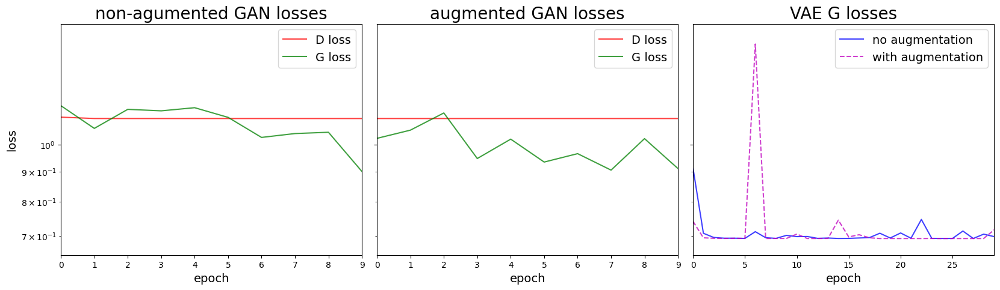

In [ ]:
fig, ax = plt.subplots(1,3, figsize=(20, 5), sharey=True) #, dpi=1000)

ax[0].plot(D_loss_no_aug, label='D loss', color = 'red', alpha = 0.75)
ax[0].plot(G_loss_no_aug, label='G loss', color = 'green', alpha = 0.75)
ax[0].set_title('non-agumented GAN losses', fontsize=20)
ax[0].set_ylim(0.65, 1.6)
ax[0].set_xlim(0, 9)
ax[0].set_xlabel('epoch',  fontsize=14)
ax[0].set_ylabel('loss',  fontsize=14)
ax[0].set_yscale('log')
ax[0].legend(fontsize=14)

ax[1].plot(D_loss_aug, label='D loss', color = 'red', alpha = 0.75)
ax[1].plot(G_loss_aug, label='G loss', color = 'green', alpha = 0.75)
ax[1].set_title('augmented GAN losses', fontsize=20)
ax[1].set_ylim(0.65, 1.6)
ax[1].set_xlim(0, 9)
ax[1].set_xlabel('epoch',  fontsize=14)
# ax[1].set_ylabel('loss',  fontsize=14)
ax[1].set_yscale('log')
ax[1].legend(fontsize=14)

ax[2].plot(np.arange(0,30,1), G_loss_VAE_no_aug, '-b',label='no augmentation', alpha = 0.75)
ax[2].plot(np.arange(0,31,1), G_loss_VAE_aug, '--m', label='with augmentation', alpha = 0.75)
ax[2].set_title('VAE G losses', fontsize=20)
ax[2].set_xlabel('epoch',  fontsize=14)
# ax[2].set_ylabel('G loss', fontsize=14)
ax[2].set_ylim(0.65, 1.6)
ax[2].set_xlim(0, 29)
ax[2].set_yscale('log')
ax[2].legend(fontsize=14)

plt.subplots_adjust(wspace=0.05, hspace=0)
plt.show()
fig.savefig('losses2.pdf', bbox_inches='tight', pad_inches=0.25)

We noticed that a decreasing trend emerges in all of the plots, particularly in the VAE's plot. But, in the GAN's plots, this decreasing trend is less visible due to the limited number of epochs.

# **4. Generating**

In [ ]:
def generate_eight_bars(generator, bar_as_first, threshold, n_generated=1, seed=False, latent_dim = noise_dim, device = device, gen='GAN'):
  '''
  function that inputs:
  - the generator G
  - a certain bar (bar_as_first) identified by its index starting from the start of train_loader
  and outputs a piano roll consisting of eight generated bars (np.array of shape(128, 128) )
  '''
  # set the evaluation mode
  generator.eval()

  with torch.no_grad():
    if seed != False:
      torch.manual_seed(seed)

    piano_rolls = []

    for _ in range(n_generated):
      for bar1, bar2 in test_loader:
        generated_bars = []

        #out of the whole batch, we take just one bar located in bar_[0]
        if bar_as_first == 1:
          bar = bar1[0].unsqueeze(0).to(device)
        else:
          bar = bar2[0].unsqueeze(0).to(device)
        generated_bars.append(bar)

        for i in range(1, 8):
          z = torch.randn(1, latent_dim, device=device)

          if gen == 'GAN':
                #use previous bar as condition
                bar = generator(z, generated_bars[i-1])

          if gen == 'VAE':
                cond = generator.fc_cond(generated_bars[i-1].view(1, -1))
                # concatenate the random variable to to the condition
                z_cond = torch.cat((z, cond), dim=1)
                # decode z_cond into a new bar
                bar = generator.decode(z_cond)

          generated_bars.append(bar)

        if gen == 'GAN': music_piece = torch.cat(generated_bars, dim=-1)
        if gen == 'VAE': music_piece = torch.cat(generated_bars, dim=3)

        piano_roll = music_piece.squeeze(0).squeeze(0)
        piano_roll = (piano_roll > threshold).float()
        piano_rolls.append(piano_roll.cpu().detach().numpy())
        break

  return piano_rolls

# **5 Evaluating the performance**
Since the standard comparison of train and test plot is not typically used to evaluate the performance of GANs, \
we use other techniques that examine the music that is generated by the trained algorithm.

## **5.1 Qualitative visual evaluation**

In [ ]:
def get_n_consecutive_notes(filenames, n_iter, n=128):
    record = []
    for i in range(n_iter):
        # firstly, I randomlye extract a filename
        filename = random.choice(filenames)
        # I then load it and retrieve its lenght
        file = torch.load(filename)
        file = file.numpy()
        tot_notes = np.shape(file)[1]
        # and find the maximum starting index (as tot_notes-n)
        # to randomly extract an index
        start = np.random.randint(0, tot_notes-n)
        n_consecutive_notes = file[:,start:(start+n)]
        record.append(n_consecutive_notes)
    return np.stack(record)

In [ ]:
sorted_filenames = sorted(filenames)
filename = sorted_filenames[23]
melody_mat, _, _, _ = melody_chords_piano_roll(filename, chords_plot=False, melody_plot=False)

In [ ]:
fig, ax = plt.subplots(1,5, figsize=(20, 5) , dpi=1000, sharey=True)

ax[0].imshow( melody_mat[:, 0:128] )
ax[0].set_xlabel('time [AU]', fontsize=14)
ax[0].set_ylabel('pitch [MIDI note]', fontsize=14)

ax[1].imshow( melody_mat[:, 500:628] )
ax[1].set_xlabel('time [AU]', fontsize=14)

ax[2].imshow( melody_mat[:, 2000:2128] )
ax[2].set_xlabel('time [AU]', fontsize=14)
ax[2].set_title('examples of 8-bar real melody piano rolls', fontsize=20)

ax[3].imshow( melody_mat[:, 1500:1628] )
ax[3].set_xlabel('time [AU]', fontsize=14)

ax[4].imshow( melody_mat[:, 2300:2428] )
ax[4].set_xlabel('time [AU]', fontsize=14)

plt.subplots_adjust(wspace=0.05, hspace=0)
plt.show()
fig.savefig('real_melody_piano_roll.pdf', bbox_inches='tight', pad_inches=0.25)

In [ ]:
fig, ax = plt.subplots(2,5, figsize=(20, 9), dpi=1000, sharey=True)
seed0, seed1, seed2, seed3, seed4 = 0, 1, 22, 333, 4444

# we generate 5 8-bar piano rolls from the non-augmented generator
ax[0][0].imshow( generate_eight_bars(G_no_aug, 2, no_aug_threshold, seed=seed0)[0] )
ax[0][0].set_xlabel('time [AU]', fontsize=14)
ax[0][0].set_ylabel('pitch [MIDI note]', fontsize=14)
ax[0][0].set_title('')

ax[0][1].imshow( generate_eight_bars(G_no_aug, 2, no_aug_threshold, seed=seed1)[0] )
ax[0][1].set_xlabel('time [AU]', fontsize=14)

ax[0][2].imshow( generate_eight_bars(G_no_aug, 2, no_aug_threshold, seed=seed2)[0] )
ax[0][2].set_xlabel('time [AU]', fontsize=14)
ax[0][2].set_title('8-bar melody piano roll generated by GAN without data augmentation', fontsize=20)

ax[0][3].imshow( generate_eight_bars(G_no_aug, 2, no_aug_threshold, seed=seed3)[0] )
ax[0][3].set_xlabel('time [AU]', fontsize=14)

ax[0][4].imshow( generate_eight_bars(G_no_aug, 2, no_aug_threshold, seed=seed4)[0] )
ax[0][4].set_xlabel('time [AU]', fontsize=14)

# we generate 5 8-bar piano rolls from the augmented generator
ax[1][0].imshow( generate_eight_bars(G_aug, 2, aug_threshold, seed=seed0)[0] )
ax[1][0].set_xlabel('time [AU]', fontsize=14)
ax[1][0].set_ylabel('pitch [MIDI note]', fontsize=14)

ax[1][1].imshow( generate_eight_bars(G_aug, 2, aug_threshold, seed=seed1)[0] )
ax[1][1].set_xlabel('time [AU]', fontsize=14)

ax[1][2].imshow( generate_eight_bars(G_aug, 2, aug_threshold, seed=seed2)[0] )
ax[1][2].set_title('8-bar melody piano roll generated by GAN with data augmentation', fontsize=20)
ax[1][2].set_xlabel('time [AU]', fontsize=14)

ax[1][3].imshow( generate_eight_bars(G_aug, 2, aug_threshold, seed=seed3)[0] )
ax[1][3].set_xlabel('time [AU]', fontsize=14)

ax[1][4].imshow( generate_eight_bars(G_aug, 2, aug_threshold, seed=seed4)[0] )
ax[1][4].set_xlabel('time [AU]', fontsize=14)

plt.subplots_adjust(wspace=0.05, hspace=0.3)
plt.show()
fig.savefig('GAN_melody_piano_roll.pdf', bbox_inches='tight', pad_inches=0.25)

The GAN melody piano rolls, especially the non-augmented ones, resemble the real and training melody piano rolls. At the same, the GAN piano rolls also show distortions, mainly in the form of abnormally long note duration. (i.e. horizontal lines).

We can see that:
- the bar generated based on the first bar resembles the sparseness that is characteristic of the beginning of the original piano rolls
- the bars generated based on bars after that, are more dense and resemble the behaviour

In [ ]:
fig, ax = plt.subplots(2,5, figsize=(20, 9), dpi=1000, sharey=True)
seed0, seed1, seed2, seed3, seed4 = 0, 1, 22, 333, 4444

# we generate 5 8-bar piano rolls from the non-augmented generator
ax[0][0].imshow( generate_eight_bars(VAE_no_aug, 2, VAE_no_aug_threshold, seed=seed0, latent_dim = 256, gen='VAE')[0] )
ax[0][0].set_xlabel('time [AU]', fontsize=14)
ax[0][0].set_ylabel('pitch [MIDI note]', fontsize=14)

ax[0][1].imshow( generate_eight_bars(VAE_no_aug, 2, VAE_no_aug_threshold, seed=seed1, latent_dim = 256, gen='VAE')[0] )
ax[0][1].set_xlabel('time [AU]', fontsize=14)

ax[0][2].imshow( generate_eight_bars(VAE_no_aug, 2, VAE_no_aug_threshold, seed=seed2, latent_dim = 256, gen='VAE')[0] )
ax[0][2].set_xlabel('time [AU]', fontsize=14)
ax[0][2].set_title('8-bar melody piano roll generated by VAE without data augmentation', fontsize=20)

ax[0][3].imshow( generate_eight_bars(VAE_no_aug, 2, VAE_no_aug_threshold, seed=seed3, latent_dim = 256, gen='VAE')[0] )
ax[0][3].set_xlabel('time [AU]', fontsize=14)

ax[0][4].imshow( generate_eight_bars(VAE_no_aug, 2, VAE_no_aug_threshold, seed=seed4, latent_dim = 256, gen='VAE')[0] )
ax[0][4].set_xlabel('time [AU]', fontsize=14)

# we generate 5 8-bar piano rolls from the augmented generator
ax[1][0].imshow( generate_eight_bars(VAE_aug, 2, VAE_aug_threshold, seed=seed0, latent_dim = 256, gen='VAE')[0] )
ax[1][0].set_xlabel('time [AU]', fontsize=14)
ax[1][0].set_ylabel('pitch [MIDI note]', fontsize=14)

ax[1][1].imshow( generate_eight_bars(VAE_aug, 2, VAE_aug_threshold, seed=seed1, latent_dim = 256, gen='VAE')[0] )
ax[1][1].set_xlabel('time [AU]', fontsize=14)

ax[1][2].imshow( generate_eight_bars(VAE_aug, 2, VAE_aug_threshold, seed=seed2, latent_dim = 256, gen='VAE')[0] )
ax[1][2].set_title('8-bar melody piano roll generated by VAE with data augmentation', fontsize=20)
ax[1][2].set_xlabel('time [AU]', fontsize=14)

ax[1][3].imshow( generate_eight_bars(VAE_aug, 2, VAE_aug_threshold, seed=seed3, latent_dim = 256, gen='VAE')[0] )
ax[1][3].set_xlabel('time [AU]', fontsize=14)

ax[1][4].imshow( generate_eight_bars(VAE_aug, 2, VAE_aug_threshold, seed=seed4, latent_dim = 256, gen='VAE')[0] )
ax[1][4].set_xlabel('time [AU]', fontsize=14)

plt.subplots_adjust(wspace=0.05, hspace=0.3)
plt.show()
fig.savefig('VAE_melody_piano_roll.pdf', bbox_inches='tight', pad_inches=0.25)

The VAE melody piano rolls show no resemblance to the real and training melody piano rolls. Instead, the generator learned a pattern mainly consisting of vertical lines, which in real life, corresponds with playing all MIDI notes at the same time. This shows that the algorithm learned when to play notes, but not how to choose which note to play.

## **5.2 Qualitative comparison of notes distributions**

Firstly, we want to get the distribution of the notes that are used in training: particularly, we want to compare the distributions with and without data augmentation to quantify its impact

In [ ]:
def extract_notes(file):
    melody_mat, _, _, _ = melody_chords_piano_roll(filename)
    active_notes = np.where( melody_mat.sum(axis=1) )[0]
    return active_notes

In [ ]:
note_lists = joblib.Parallel(n_jobs=10, verbose=0)(
    joblib.delayed(extract_notes)(file)
    for file in filenames_sorted)
all_notes_real_data = np.concatenate([note_list for note_list in note_lists])

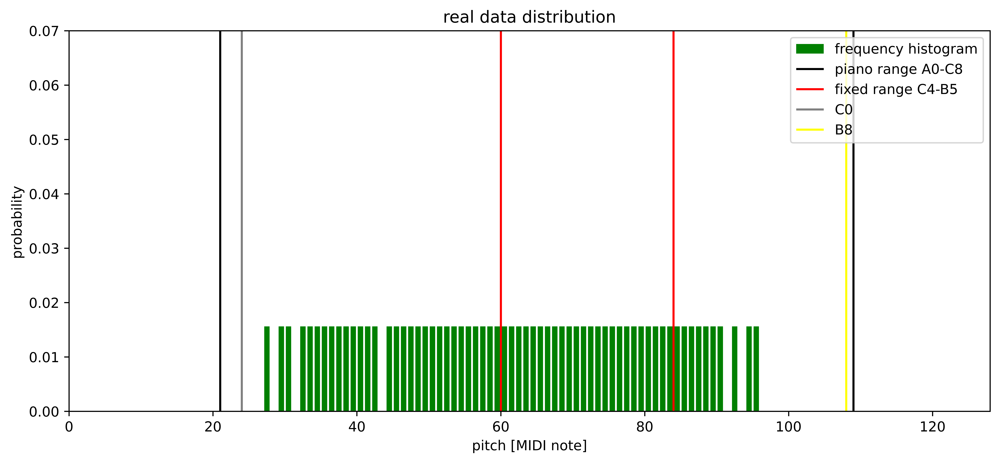

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(12, 5), dpi=1000)
ax.hist(all_notes_real_data, density=True, color='green', rwidth=0.75, bins=np.arange(0, 127, 1), label='frequency histogram')
ax.set_title('real data distribution')
ax.set_xlabel('pitch [MIDI note]')
ax.set_ylabel('probability')
ax.set_xlim(0, 128)
ax.set_ylim(0, 0.07)
ax.vlines(21, 0, 1, color='black',label='piano range A0-C8')
ax.vlines(109, 0, 1, color='black')
ax.vlines(60, 0, 1, color='red',label='fixed range C4-B5')
ax.vlines(84, 0, 1, color='red')
ax.vlines(24, 0, 1, color='gray',label='C0')
ax.vlines(108, 0, 1, color='yellow', label='B8')
ax.legend()

plt.show()
fig.savefig('real_distribution.pdf', bbox_inches='tight', pad_inches=0.25)

We noticed that the real note distribution is almost uniform, and covers a majority of the notes that can be played on a real-life piano. Therefore, potential future biases in music generation can not be directly blamed on the original data.

In [ ]:
def loader_note_distribution(data_loader):
    '''
    function that computes the distribution of all the bars that make up a data_loader
    and that the GAN is trained on
    '''
    notes_archive = []
    for bar1, bar2 in data_loader:
        bar1 = bar1.cpu().numpy()
        bar2 = bar2.cpu().numpy()
        for b1, b2 in zip(bar1, bar2):
            active_notes_1 = np.where( b1.sum(axis=2) >0 )[1]
            active_notes_2 = np.where( b2.sum(axis=2) >0 )[1]
            notes_archive = np.concatenate( [notes_archive, active_notes_1, active_notes_2] )
    return notes_archive

In [ ]:
if run:
    notes_archive_no_aug = loader_note_distribution(train_loader_no_aug)
    notes_archive_aug = loader_note_distribution(train_loader_aug)
    np.savez(dir+'all_training_notes.npz', no_aug=notes_archive_no_aug, aug=notes_archive_aug)
else:
    all_training_notes = np.load(dir+'all_training_notes.npz')
    notes_archive_no_aug = all_training_notes['no_aug']
    notes_archive_aug = all_training_notes ['aug']

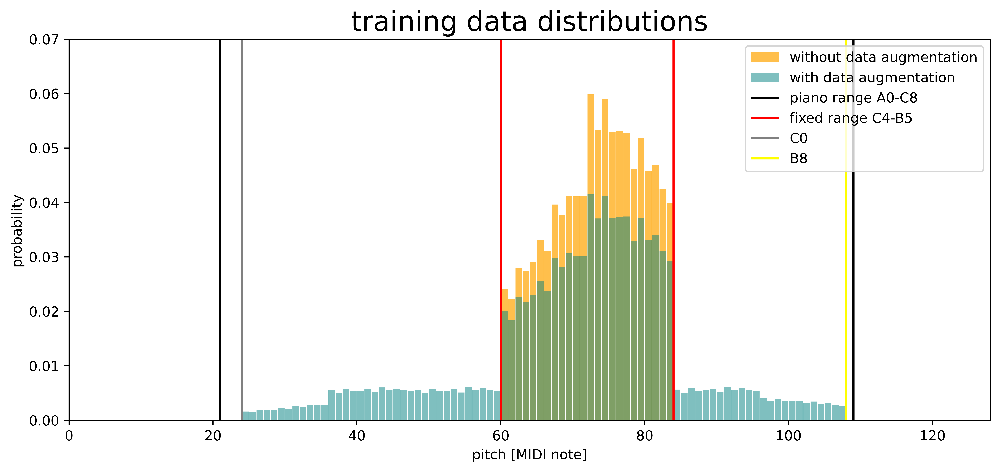

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(12, 5), dpi=1000)
ax.hist(notes_archive_no_aug, density=True, color='orange',rwidth=0.9, bins=np.arange(0, 127, 1), label='without data augmentation', alpha=0.7)
ax.hist(notes_archive_aug, density=True, color='teal', rwidth=0.9, bins=np.arange(0, 127, 1), label='with data augmentation', alpha=0.5)
ax.set_title('training data distributions', fontsize=20)
ax.set_xlabel('pitch [MIDI note]')
ax.set_ylabel('probability')
ax.set_xlim(0, 128)
ax.set_ylim(0, 0.07)
ax.vlines(21, 0, 1, color='black',label='piano range A0-C8')
ax.vlines(109, 0, 1, color='black')
ax.vlines(60, 0, 1, color='red',label='fixed range C4-B5')
ax.vlines(84, 0, 1, color='red')
ax.vlines(24, 0, 1, color='gray',label='C0')
ax.vlines(108, 0, 1, color='yellow', label='B8')
ax.legend()

plt.show()
fig.savefig('training_distribution.pdf', bbox_inches='tight', pad_inches=0.25)

The note distribution changes significantly after switching to fixed range melody piano rolls. For non-augmented data, the distribution is limited to the fixed range. While, for augmented data, it spans most of the piano range. Despite their differences, these distributions share a similar asymmetric shape and differ only for the tails, which values can only be obtained through data augmentation.

We now want to compare the distributions above to the distributions of the bars that are generated by their respective trained generators.

In [ ]:
def generated_notes(generator, threshold, noise_dim, n_iter=5000, gen='VAE'):
    '''
    function that generates
    '''
    notes_archive = []
    piano_rolls = generate_eight_bars(generator, 2, threshold, n_generated=n_iter, seed=False, latent_dim = noise_dim, device = device, gen=gen)
    for piano_roll in piano_rolls:
        active_notes = np.where( piano_roll.sum(axis=1) >0 )[0]
        notes_archive = np.concatenate( [notes_archive, active_notes])
    return notes_archive

In [ ]:
n_iter = 5*10**3
generated_notes_no_aug = generated_notes(G_no_aug, no_aug_threshold, noise_dim, n_iter=n_iter, gen='GAN')
generated_notes_aug = generated_notes(G_aug, aug_threshold, noise_dim, n_iter=n_iter, gen='GAN')

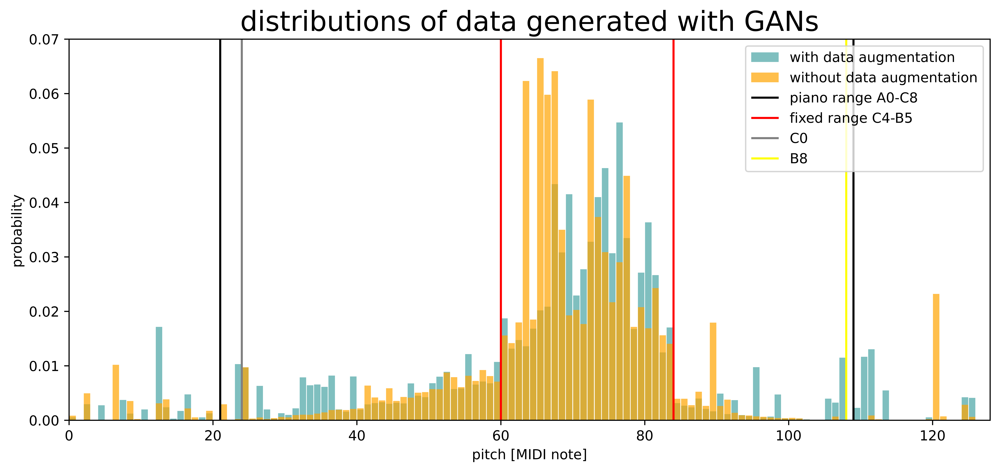

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(12, 5), dpi=1000)
ax.hist(generated_notes_aug, density=True, color='teal', rwidth=0.9, bins=np.arange(0, 127, 1), label='with data augmentation', alpha=0.5)
ax.hist(generated_notes_no_aug, density=True, color='orange',rwidth=0.9, bins=np.arange(0, 127, 1), label='without data augmentation', alpha=0.7)
ax.set_title('distributions of data generated with GANs', fontsize=20)
ax.set_xlabel('pitch [MIDI note]')
ax.set_ylabel('probability')
ax.set_xlim(0, 128)
ax.set_ylim(0, 0.07)
ax.vlines(21, 0, 1, color='black',label='piano range A0-C8')
ax.vlines(109, 0, 1, color='black')
ax.vlines(60, 0, 1, color='red',label='fixed range C4-B5')
ax.vlines(84, 0, 1, color='red')
ax.vlines(24, 0, 1, color='gray',label='C0')
ax.vlines(108, 0, 1, color='yellow', label='B8')
ax.legend()

plt.show()
fig.savefig('GAN_distribution.pdf', bbox_inches='tight', pad_inches=0.25)

Both GAN distributions, with and without augmentation, correctly show a resemblance to the training distributions. More specifically, the majority of the notes fall within the fixed range. Notes outside of the fixed range can be observed in both augmented and non-augmented distributions, meaning the algorithm is able to generalize independently of the training data.  

In [ ]:
n_iter = 5*10**3
VAE_generated_notes_no_aug = generated_notes(VAE_no_aug, VAE_no_aug_threshold, noise_dim=256, n_iter=n_iter, gen='VAE')
VAE_generated_notes_aug = generated_notes(VAE_aug, VAE_aug_threshold, noise_dim=256, n_iter=n_iter, gen='VAE')

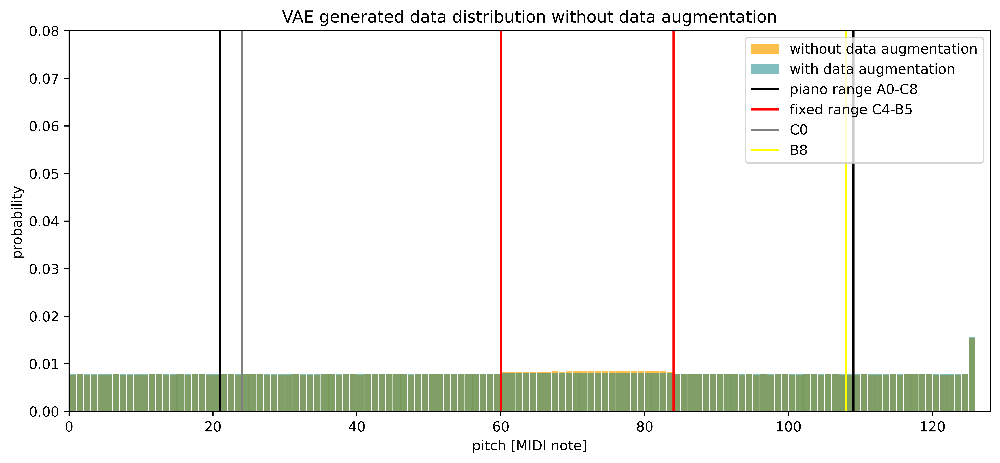

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(12, 5), dpi=1000)
ax.hist(VAE_generated_notes_no_aug, density=True, color='orange',rwidth=0.9, bins=np.arange(0, 127, 1), label='without data augmentation', alpha=0.7)
ax.hist(VAE_generated_notes_aug, density=True, color='teal', rwidth=0.9, bins=np.arange(0, 127, 1), label='with data augmentation', alpha=0.5)
ax.set_title('VAE generated data distribution without data augmentation')
ax.set_xlabel('pitch [MIDI note]')
ax.set_ylabel('probability')
ax.set_xlim(0, 128)
ax.set_ylim(0, 0.08)
ax.vlines(21, 0, 1, color='black',label='piano range A0-C8')
ax.vlines(109, 0, 1, color='black')
ax.vlines(60, 0, 1, color='red',label='fixed range C4-B5')
ax.vlines(84, 0, 1, color='red')
ax.vlines(24, 0, 1, color='gray',label='C0')
ax.vlines(108, 0, 1, color='yellow', label='B8')
ax.legend()

plt.show()
fig.savefig('VAE_distribution.pdf', bbox_inches='tight', pad_inches=0.25)

For VAE, we observe very similar distributions between the augmented and non-augmented implementations. The non-augmented distribution is unrealistically uniform across the whole MIDI range, which corresponds to playing all MIDI notes at the same time. Therefore, it seems like the algorithms has an idea of when to play notes, but doesn't know how to choose between the notes.

In [ ]:
fig, ax = plt.subplots(4,1, figsize=(14,20), dpi=1000)

ax[0].hist(all_notes_real_data, density=True, color='green', rwidth=0.75, bins=np.arange(0, 127, 1), label='frequency histogram')
ax[0].set_title('real data distribution', fontsize=20)
ax[0].set_xlabel('pitch [MIDI note]', fontsize=14)
ax[0].set_ylabel('probability', fontsize=14)
ax[0].set_xlim(0, 128)
ax[0].set_ylim(0, 0.07)
ax[0].vlines(21, 0, 1, color='black',label='piano range A0-C8')
ax[0].vlines(109, 0, 1, color='black')
ax[0].vlines(60, 0, 1, color='red',label='fixed range C4-B5')
ax[0].vlines(84, 0, 1, color='red')
ax[0].vlines(24, 0, 1, color='gray',label='C0')
ax[0].vlines(108, 0, 1, color='yellow', label='B8')
ax[0].legend(fontsize=14)

ax[1].hist(notes_archive_no_aug, density=True, color='orange',rwidth=0.9, bins=np.arange(0, 127, 1), label='without data augmentation', alpha=0.7)
ax[1].hist(notes_archive_aug, density=True, color='teal', rwidth=0.9, bins=np.arange(0, 127, 1), label='with data augmentation', alpha=0.5)
ax[1].set_title('training data distributions', fontsize=20)
ax[1].set_xlabel('pitch [MIDI note]', fontsize=14)
ax[1].set_ylabel('probability', fontsize=14)
ax[1].set_xlim(0, 128)
ax[1].set_ylim(0, 0.07)
ax[1].vlines(21, 0, 1, color='black',label='piano range A0-C8')
ax[1].vlines(109, 0, 1, color='black')
ax[1].vlines(60, 0, 1, color='red',label='fixed range C4-B5')
ax[1].vlines(84, 0, 1, color='red')
ax[1].vlines(24, 0, 1, color='gray',label='C0')
ax[1].vlines(108, 0, 1, color='yellow', label='B8')
ax[1].legend(fontsize=14)

ax[2].hist(generated_notes_aug, density=True, color='teal', rwidth=0.9, bins=np.arange(0, 127, 1), label='with data augmentation', alpha=0.5)
ax[2].hist(generated_notes_no_aug, density=True, color='orange',rwidth=0.9, bins=np.arange(0, 127, 1), label='without data augmentation', alpha=0.7)
ax[2].set_title('distributions of data generated with GAN', fontsize=20)
ax[2].set_xlabel('pitch [MIDI note]', fontsize=14)
ax[2].set_ylabel('probability', fontsize=14)
ax[2].set_xlim(0, 128)
ax[2].set_ylim(0, 0.07)
ax[2].vlines(21, 0, 1, color='black',label='piano range A0-C8')
ax[2].vlines(109, 0, 1, color='black')
ax[2].vlines(60, 0, 1, color='red',label='fixed range C4-B5')
ax[2].vlines(84, 0, 1, color='red')
ax[2].vlines(24, 0, 1, color='gray',label='C0')
ax[2].vlines(108, 0, 1, color='yellow', label='B8')
ax[2].legend(fontsize=14)

ax[3].hist(VAE_generated_notes_no_aug, density=True, color='orange',rwidth=0.9, bins=np.arange(0, 127, 1), label='without data augmentation', alpha=0.7)
ax[3].hist(VAE_generated_notes_aug, density=True, color='teal', rwidth=0.9, bins=np.arange(0, 127, 1), label='with data augmentation', alpha=0.5)
ax[3].set_title('distributions of data generated with VAE', fontsize=20)
ax[3].set_xlabel('pitch [MIDI note]', fontsize=14)
ax[3].set_ylabel('probability', fontsize=14)
ax[3].set_xlim(0, 128)
ax[3].set_ylim(0, 0.07)
ax[3].vlines(21, 0, 1, color='black',label='piano range A0-C8')
ax[3].vlines(109, 0, 1, color='black')
ax[3].vlines(60, 0, 1, color='red',label='fixed range C4-B5')
ax[3].vlines(84, 0, 1, color='red')
ax[3].vlines(24, 0, 1, color='gray',label='C0')
ax[3].vlines(108, 0, 1, color='yellow', label='B8')
ax[3].legend(fontsize=14)

plt.subplots_adjust(wspace=0, hspace=0.3)
plt.show()
fig.savefig('distributions.pdf', bbox_inches='tight', pad_inches=0.25)

## **5.3 Quantitative evaluation based on score**

To quantitatively examine the data that is artificially generated by the GAN, we will examin one of the most popular scores for GAN performance evaluation: the **Fréchet Inception Distance** (**FID**) is a metric that:
- evaluates the quality of artificially gnerated data by generative models
- compares the distributions of real data and artificially generated data based on the feature representation of a pre-trained network called **Inception v3**, which input data must be 299 by 299, and outputs 2048 dimensional feature vectors
- computes the distance between the two multivariate Gaussian distribution that are characterized by the mean and covariance of the feature vectors extracted from real and artificially generated data

A lower the FID score indicates that the generated images are closer in quality and diversity to the real images (with 0 being a perfect match).


In [ ]:
# Ioad Inception v3 model
model = models.inception_v3(pretrained=True, transform_input=False)
model.eval()

# and I define the transformations that need to be applied to
# both real and fake music to be able to feed them to the
# inception_v3 model, which include:
transform = transforms.Compose([
    transforms.Resize((299, 299)), # resizing from (128,128) to (299,299)
    transforms.Grayscale(3),  # converting a single-channel to 3-channel
    transforms.ToTensor(),  # converting to PyTorch tensor
    transforms.Normalize([0.485, 0.456, 0.406],
                                        [0.229, 0.224, 0.225])  # normalization
])

def get_activation(music):
    '''
    function that extracts features for the computation of
    the FID score with inception_v3 model
    '''
    with torch.no_grad():
        return model(music)

# Calculate FID
def calculate_fid(real_activations, fake_activations):
    '''
    function that computes the FID score
    '''
    mu_real = np.mean(real_activations, axis=0)
    mu_fake = np.mean(fake_activations, axis=0)

    cov_real = np.cov(real_activations, rowvar=False)
    cov_fake = np.cov(fake_activations, rowvar=False)

    # Calculate FID
    ssdiff = np.sum((mu_real - mu_fake) ** 2)
    cov_sqrt = sqrtm(cov_real.dot(cov_fake))
    if np.iscomplexobj(cov_sqrt):
        cov_sqrt = cov_sqrt.real
    fid = ssdiff + np.trace(cov_real + cov_fake - 2 * cov_sqrt)
    return fid

def prepare_images(images, transform):
    transformed_images = []
    for img in images:
        # Ensure img is in a format that transforms can accept (either PIL Image or ndarray)
        if isinstance(img, np.ndarray):
            img = Image.fromarray(img)  # Convert NumPy array to PIL Image
        img_tensor = transform(img)  # Apply transformations directly on the image
        transformed_images.append(img_tensor)
    return torch.stack(transformed_images)

C:\Users\ecica\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\ecica\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
n_samples = 1000
# we load the vector of real 8-bars
real_music = get_n_consecutive_notes(test_filenames, n_samples, n=128)
# and the vector of generated 8-bars
fake_music_no_aug =generate_eight_bars(G_no_aug, 2, threshold=no_aug_threshold,
                                    n_generated=n_samples)
fake_music_aug =generate_eight_bars(G_aug, 2, threshold=no_aug_threshold,
                                    n_generated=n_samples)

#
real_music_transformed = prepare_images(real_music, transform)
fake_music_transformed_no_aug = prepare_images(fake_music_no_aug, transform)
fake_music_transformed_aug = prepare_images(fake_music_aug, transform)

#
real_features = get_activation(real_music_transformed).cpu().numpy()
fake_features_no_aug = get_activation(fake_music_transformed_no_aug).cpu().numpy()
fake_features_aug = get_activation(fake_music_transformed_aug).cpu().numpy()

fid_value_no_aug = calculate_fid(real_features, fake_features_no_aug)
fid_value_aug = calculate_fid(real_features, fake_features_aug)
print("the FID for the GAN non-augmented generator is : ", fid_value_no_aug)
print("the FID for the GAN augmented generator is : ", fid_value_aug)

C:\Users\ecica\AppData\Local\Temp\ipykernel_11408\1383318741.py:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  file = torch.load(filename)


the FID for the GAN non-augmented generator is :  2.4357066067973756
the FID for the GAN augmented generator is :  6.1497980784959125


In [ ]:
# we load the vector of real 8-bars
test_filenames = glob.glob(dataset_dir+'/test/*.pth*')
real_music = get_n_consecutive_notes(test_filenames, n_samples, n=128)
# and the vector of generated 8-bars
fake_music_no_aug = generate_eight_bars(VAE_no_aug, 2, threshold=VAE_no_aug_threshold,
                                        n_generated=n_samples, latent_dim = 256, device = device, gen = 'VAE')
fake_music_aug = generate_eight_bars(VAE_no_aug, 2, threshold=VAE_aug_threshold,
                                        n_generated=n_samples, latent_dim = 256, device = device, gen = 'VAE')

#
real_music_transformed = prepare_images(real_music, transform)
fake_music_transformed_no_aug = prepare_images(fake_music_no_aug, transform)
fake_music_transformed_aug = prepare_images(fake_music_aug, transform)

#
real_features = get_activation(real_music_transformed).cpu().numpy()
fake_features_no_aug = get_activation(fake_music_transformed_no_aug).cpu().numpy()
fake_features_aug = get_activation(fake_music_transformed_aug).cpu().numpy()

fid_value_no_aug = calculate_fid(real_features, fake_features_no_aug)
fid_value_aug = calculate_fid(real_features, fake_features_aug)
print("the FID for the non-augmented VAE generator is : ", fid_value_no_aug)
print("the FID for the augmented VAE generator is : ", fid_value_aug)

C:\Users\ecica\AppData\Local\Temp\ipykernel_11408\1383318741.py:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  file = torch.load(filename)


the FID for the non-augmented VAE generator is :  168.1499405728536
the FID for the augmented VAE generator is :  255.21623441478636


# **References**

[1] [MidiNet: A Convolutional Generative Adversarial Network for Symbolic-domain Music Generation, by Li-Chia Yang, Szu-Yu Chou, Yi-Hsuan Yang](https://arxiv.org/pdf/1703.10847)